In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Ellipse
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 18

corr_data = pmdata2016_2019_25.corr(method='spearman')

threshold = 0.02
cmap = sns.diverging_palette(240, 10, as_cmap=True)
mask = np.triu(np.ones_like(corr_data, dtype=bool))
fig, ax = plt.subplots(figsize=(15, 14), dpi=100)
sns.heatmap(corr_data, mask=mask, annot=True, fmt=".2f", cmap="RdBu_r",
            cbar=True, ax=ax, vmin=-1, vmax=1, square=True, linewidths=.5, linecolor='grey')

xticks = ax.get_xticks()
yticks = ax.get_yticks()

for i in range(len(corr_data)):
    for j in range(i+1, len(corr_data)):
        value = corr_data.iloc[i, j]
        if np.abs(value) > threshold:
            color = cmap(0.5 * (value + 1)) 
            angle = 45 if value > 0 else 135
            ellipse = Ellipse((xticks[j], yticks[i]), width=np.abs(value), height=0.6, angle=angle,
                              facecolor=color, edgecolor='black', lw=0.2)
            ax.add_patch(ellipse)

ax.set_xticks(xticks, minor=False)
ax.set_yticks(yticks, minor=False)
ax.set_xticklabels(corr_data.columns)
ax.set_yticklabels(corr_data.columns)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('./figure/heatmap_pm25.png', dpi=600)
plt.show()

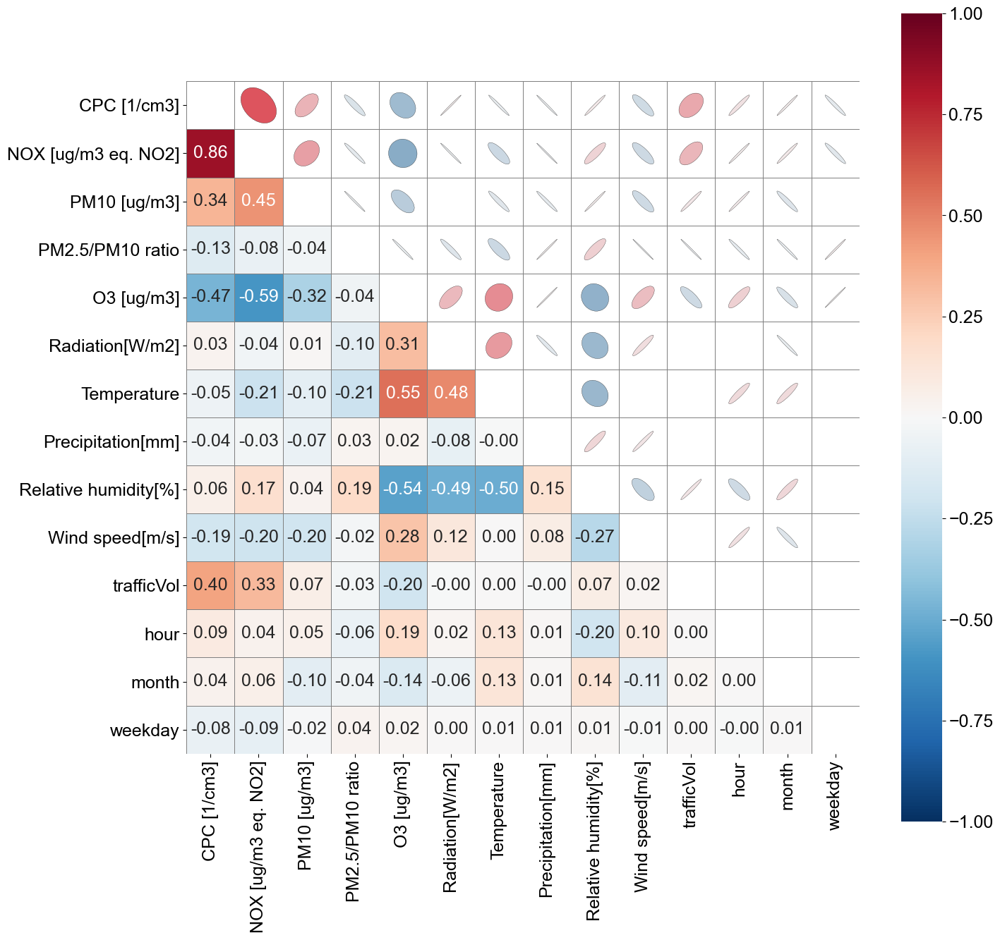

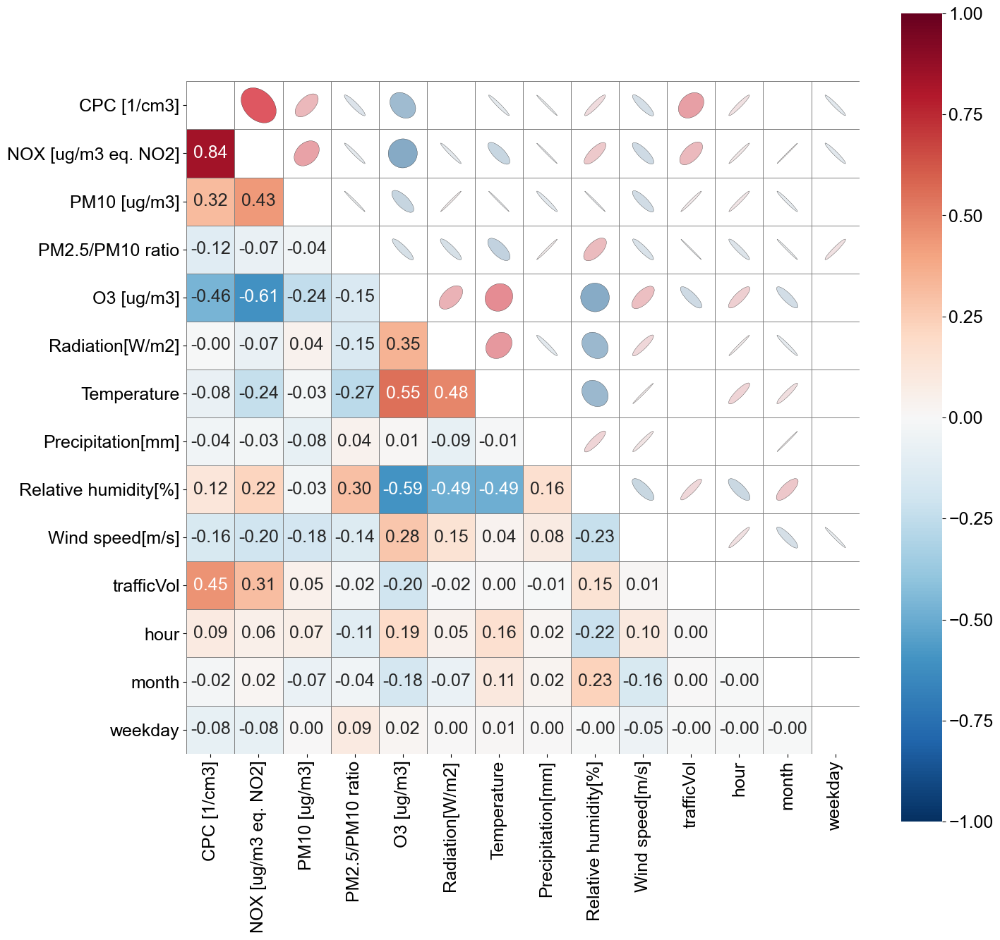

In [50]:
import os
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Ellipse
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 18


feature_folder = '../../pncEstimator-main/data/NABEL/feature_eng/'
pncdata2016_2019 = pd.read_csv(feature_folder + 'feature_data_2016_2019.csv')
pncdata2020 = pd.read_csv(feature_folder + 'feature_data_2020.csv')
pncdata2016_2019 = pncdata2016_2019.iloc[:,1:]
pncdata2020 = pncdata2020.iloc[:,1:]
pncdata2016_2019 = pncdata2016_2019[['Date/time', 'station', 'CPC [1/cm3]', 'NOX [ug/m3 eq. NO2]',
                   'PM10 [ug/m3]', 'PM2.5/PM10 ratio', 'O3 [ug/m3]',
                   'Radiation[W/m2]', 'Temperature', 'Precipitation[mm]',
                   'Relative humidity[%]', 'Wind speed[m/s]', 'trafficVol', 'hour', 'month', 'weekday']]
pncdata2020 = pncdata2020[['Date/time', 'station', 'CPC [1/cm3]', 'NOX [ug/m3 eq. NO2]',
                   'PM10 [ug/m3]', 'PM2.5/PM10 ratio', 'O3 [ug/m3]',
                   'Radiation[W/m2]', 'Temperature', 'Precipitation[mm]',
                   'Relative humidity[%]', 'Wind speed[m/s]', 'trafficVol', 'hour', 'month', 'weekday']]

plt.rcParams['font.family'] = 'Arial'
pncdata2016_2019_corr = pncdata2016_2019.corr()
pncdata2020_corr = pncdata2020.corr()

threshold = 0.02
cmap = sns.diverging_palette(240, 10, as_cmap=True)
fig, ax = plt.subplots(figsize=(15, 14), dpi=100)
mask = np.triu(np.ones_like(pncdata2016_2019_corr, dtype=bool))
sns.heatmap(pncdata2016_2019_corr, mask=mask, annot=True, fmt=".2f", cmap="RdBu_r",
            cbar=True, ax=ax, vmin=-1, vmax=1, square=True, linewidths=.5, linecolor='grey')
xticks = ax.get_xticks()
yticks = ax.get_yticks()
for i in range(len(pncdata2016_2019_corr)):
    for j in range(i+1, len(pncdata2016_2019_corr)):
        value = pncdata2016_2019_corr.iloc[i, j]
        if np.abs(value) > threshold:
            color = cmap(0.5 * (value + 1)) 
            angle = 45 if value > 0 else 135
            ellipse = Ellipse((xticks[j], yticks[i]), width=np.abs(value), height=0.6, angle=angle,
                              facecolor=color, edgecolor='black', lw=0.2)
            ax.add_patch(ellipse)
ax.set_xticks(xticks, minor=False)
ax.set_yticks(yticks, minor=False)
ax.set_xticklabels(pncdata2016_2019_corr.columns)
ax.set_yticklabels(pncdata2016_2019_corr.columns)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('../SI_figure/S3/pnc_heatmap/pncdata2016_2019.png', dpi=600, bbox_inches='tight')
plt.show()

fig, ax = plt.subplots(figsize=(15, 14), dpi=100)
mask = np.triu(np.ones_like(pncdata2020_corr, dtype=bool))
sns.heatmap(pncdata2020_corr, mask=mask, annot=True, fmt=".2f", cmap="RdBu_r",
            cbar=True, ax=ax, vmin=-1, vmax=1, square=True, linewidths=.5, linecolor='grey')
xticks = ax.get_xticks()
yticks = ax.get_yticks()
for i in range(len(pncdata2020_corr)):
    for j in range(i+1, len(pncdata2020_corr)):
        value = pncdata2020_corr.iloc[i, j]
        if np.abs(value) > threshold:
            color = cmap(0.5 * (value + 1)) 
            angle = 45 if value > 0 else 135
            ellipse = Ellipse((xticks[j], yticks[i]), width=np.abs(value), height=0.6, angle=angle,
                              facecolor=color, edgecolor='black', lw=0.2)
            ax.add_patch(ellipse)
ax.set_xticks(xticks, minor=False)
ax.set_yticks(yticks, minor=False)
ax.set_xticklabels(pncdata2020_corr.columns)
ax.set_yticklabels(pncdata2020_corr.columns)
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('../SI_figure/S3/pnc_heatmap/pncdata2020.png', dpi=600, bbox_inches='tight')
plt.show()

In [26]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# load pred data
pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1203.csv')
pnc_pred2020  = pnc_pred2020.drop(['Unnamed: 0'], axis=1)

# load pred data DL
pnc_data_pred_DL = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata_2020_pred_DL.csv')
pnc_data_pred_DL = pnc_data_pred_DL.iloc[:, 1:]

# load results data
hist_plot = pd.read_csv('../../mypred/out/pred_table/results_plot/results1130_2.csv')
hist_plot['RMSE'] = np.sqrt(hist_plot['mse'])

# calculate bias
cpc_mean = np.mean(pnc_pred2020['CPC [1/cm3]'])
cpc_var = np.var(pnc_pred2020['CPC [1/cm3]'])
model = []
bias = []
G_error = []
for col in pnc_pred2020.filter(like='_pred'):
    pnc_pred2020[col.split('_')[0] + '_bias'] = pnc_pred2020[col] - cpc_mean
    model.append(col.split('_')[0])
    temp_resid = pnc_pred2020[col.split('_')[0] + '_bias']
    bias.append(np.mean(temp_resid))
    G_error.append(pow(np.mean(temp_resid), 2) + cpc_var)
bias_df = pd.DataFrame({'model': model, 'bias': bias, 'G_error': G_error})
for i in range(len(bias_df)):
    if (bias_df['model'][i]=='ada'):
        bias_df['model'][i]='adaboost'
    elif (bias_df['model'][i]=='stack'):
        bias_df['model'][i]='stacking'

# calculate bias DL
cpc_mean_DL = np.mean(pnc_data_pred_DL['CPC [1/cm3]'])
cpc_var_DL = np.var(pnc_data_pred_DL['CPC [1/cm3]'])
model_DL = []
bias_DL = []
G_error_DL = []
for col in pnc_data_pred_DL.filter(like='_pred'):
    pnc_data_pred_DL[col.split('_')[0] + '_bias'] = pnc_data_pred_DL[col] - cpc_mean_DL
    model_DL.append(col.split('_')[0])
    temp_resid = pnc_data_pred_DL[col.split('_')[0] + '_bias']
    bias_DL.append(np.mean(temp_resid))
    G_error_DL.append(pow(np.mean(temp_resid), 2) + cpc_var_DL)
bias_df_DL = pd.DataFrame({'model': model_DL, 'bias': bias_DL, 'G_error': G_error_DL})

hist_plot_data = pd.merge(hist_plot, bias_df, on='model', how='left')
hist_plot_data = pd.merge(hist_plot_data, bias_df_DL, on='model', how='left')
hist_plot_data['bias'] = hist_plot_data['bias_x'].combine_first(hist_plot_data['bias_y'])
hist_plot_data['G_error'] = hist_plot_data['G_error_x'].combine_first(hist_plot_data['G_error_y'])
hist_plot_data = hist_plot_data.drop(columns=['bias_x', 'bias_y', 'G_error_x', 'G_error_y'])
hist_plot_data.loc[hist_plot_data['model'] == 'timesnet', 'bias'] = -540.009079
hist_plot_data['model'] = ['Linear', 'Lasso', 'SVM', 'KNN', 'Decision Tree', 'Random Forest',
                           'AdaBoost', 'Gradient Boosting', 'LightGBM', 'Stem-PNC', 'RNN', 'CNN', 'LSTM']
hist_plot_data_temp = hist_plot_data.copy()
hist_plot_data_temp[['r2', 'evs']] = hist_plot_data[['r2', 'evs']].apply(lambda x: round(x, 2))
hist_plot_data_temp[['mse']] = hist_plot_data[['mse']].applymap(lambda x: "{:.2e}".format(x))
hist_plot_data_temp[['G_error']] = hist_plot_data[['G_error']].applymap(lambda x: "{:.3e}".format(x))
hist_plot_data_temp[['mae', 'RMSE', 'bias']] = hist_plot_data[['mae', 'RMSE', 'bias']].apply(lambda x: round(x, 0))
hist_plot_data_temp

,mse,mae,r2,evs,model,RMSE,bias,G_error
0,3.67e+07,3642.0,0.73,0.74,Linear,6056.0,-768.0,1.371e+08
1,3.71e+07,3650.0,0.73,0.73,Lasso,6091.0,-808.0,1.372e+08
2,5.94e+07,4110.0,0.56,0.58,SVM,7710.0,-1625.0,1.392e+08
3,2.80e+07,3307.0,0.80,0.80,KNN,5288.0,-220.0,1.366e+08
4,2.89e+07,3214.0,0.79,0.80,Decision Tree,5376.0,-959.0,1.374e+08
5,2.25e+07,2727.0,0.84,0.84,Random Forest,4746.0,-552.0,1.368e+08
6,4.08e+07,3936.0,0.70,0.71,AdaBoost,6387.0,-900.0,1.373e+08
7,2.41e+07,2845.0,0.82,0.83,Gradient Boosting,4911.0,-790.0,1.371e+08
8,2.35e+07,2792.0,0.83,0.83,LightGBM,4846.0,-723.0,1.370e+08
9,2.11e+07,2830.0,0.85,0.85,Stem-PNC,4594.0,124.0,1.365e+08


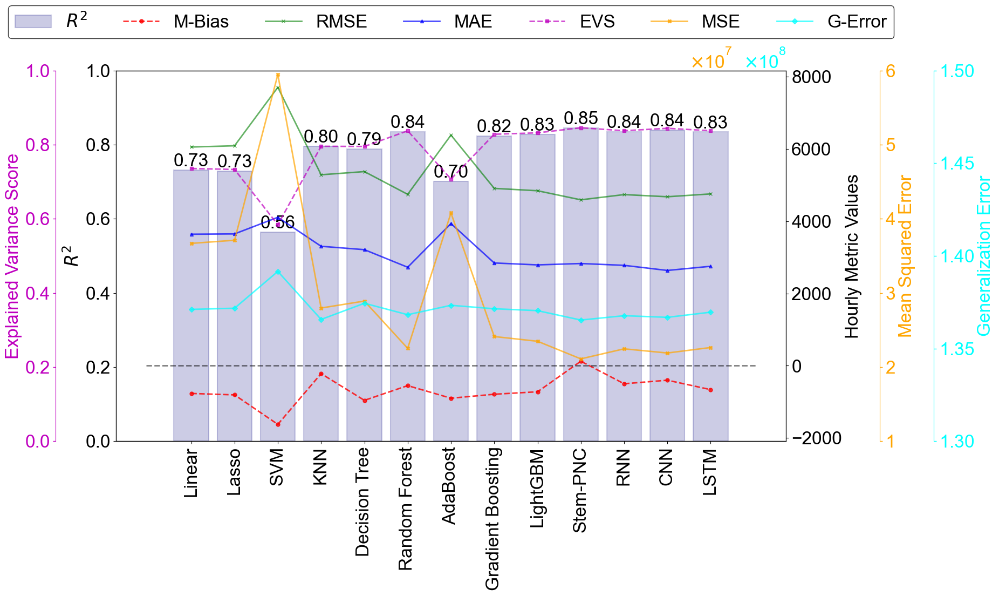

In [27]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 24
from matplotlib.ticker import ScalarFormatter, MaxNLocator

fig, ax1 = plt.subplots(dpi=100, figsize=(20, 12))

# R2 plot
bars = ax1.bar(hist_plot_data['model'], hist_plot_data['r2'], 
               alpha=0.2, color='navy',
               label=r'${R^2}$', edgecolor='navy', linewidth=1.5)

# Adding data labels for the bars
for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width() / 2, height, '{:.2f}'.format(height),
             ha='center', va='bottom', color='black')
ax1.set_xticks(hist_plot_data['model'])
ax1.set_xticklabels(hist_plot_data['model'], rotation=90)
ax1.set_ylabel(r'${R^2}$')
ax1.set_ylim(0, 1)

# Bias plot
ax2 = ax1.twinx()
ax2.plot(hist_plot_data['model'], hist_plot_data['bias'], 'r--',
         marker='o', linewidth=2, alpha=0.8, label='M-Bias', markersize=5)
# RMSE plot
ax2.plot(hist_plot_data['model'], hist_plot_data['RMSE'], 'g-+',
         marker='x', linewidth=2, alpha=0.6, label='RMSE', markersize=5)
# MAE plot
ax2.plot(hist_plot_data['model'], hist_plot_data['mae'], 'b-+',
         marker='^', linewidth=2, alpha=0.7, label='MAE', markersize=5)


xlim = ax2.get_xlim()
x = np.linspace(xlim[0], xlim[1], len(hist_plot_data['model']))
ax2.plot(x, np.zeros_like(x), 'k--', linewidth=2, alpha=0.5)
# ax2.plot(model_type_means['model_type'], np.zeros((len(model_type_means['model_type']), 1)), 'k--', linewidth=1, alpha=0.5)
ax2.set_ylabel('Hourly Metric Values')
# ax2.legend(loc='upper center', frameon=False)

ax3 = ax1.twinx()
ax3.tick_params(axis='y', labelcolor='m', color='m',
                left=True, right=False)
ax3.plot(hist_plot_data['model'], hist_plot_data['evs'], 'm--',
            marker='s', linewidth=2, alpha=0.7, label='EVS', markersize=5)
ax3.set_ylabel('Explained Variance Score', color='m')
ax3.xaxis.set_visible(False)
ax3.spines['left'].set_position(('axes', -0.09))
ax3.spines['left'].set_color('m')
ax3.yaxis.set_label_position('left')
ax3.yaxis.set_ticks_position('left')
ax3.yaxis.set_tick_params(color='m', width=1)
ax3.set_ylim(0, 1)

ax4 = ax1.twinx()
ax4.tick_params(axis='y', labelcolor='orange', color='orange',
                left=False, right=True)
ax4.plot(hist_plot_data['model'], hist_plot_data['mse'], 'orange',
         marker='X', linewidth=2, alpha=0.7, label='MSE', markersize=5)
ax4.set_ylabel('Mean Squared Error', color='orange')
ax4.xaxis.set_visible(False)
ax4.spines['right'].set_position(('axes', 1.14))
ax4.spines['right'].set_color('orange')
ax4.yaxis.set_label_position('right')
ax4.yaxis.set_ticks_position('right')
ax4.yaxis.set_tick_params(color='orange', width=1)
ax4.set_ylim(10000000, 60000000)
ax4.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax4.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax4.yaxis.get_offset_text().set_x(0.92)

ax5 = ax1.twinx()
ax5.tick_params(axis='y', labelcolor='cyan', color='cyan',
                left=False, right=True)
ax5.plot(hist_plot_data['model'], hist_plot_data['G_error'], 'cyan',
            marker='D', linewidth=2, alpha=0.7, label='G-Error', markersize=5)
ax5.set_ylabel('Generalization Error', color='cyan')
ax5.xaxis.set_visible(False)
ax5.spines['right'].set_position(('axes', 1.22))
ax5.spines['right'].set_color('cyan')
ax5.yaxis.set_label_position('right')
ax5.yaxis.set_ticks_position('right')
ax5.yaxis.set_tick_params(color='cyan', width=1)
ax5.set_ylim(130000000, 150000000)
ax5.yaxis.set_major_locator(MaxNLocator(4))
ax5.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
ax5.ticklabel_format(axis="y", style="sci", scilimits=(0,0))
ax5.yaxis.get_offset_text().set_x(1.0)

# Combining the legends from both the plots and placing it on top of the figure
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines3, labels3 = ax3.get_legend_handles_labels()
lines4, labels4 = ax4.get_legend_handles_labels()
lines5, labels5 = ax5.get_legend_handles_labels()
ax4.legend(lines + lines2 + lines3 + lines4 + lines5,
           labels + labels2 + labels3 + labels4 + labels5,
              loc='upper center', ncol=8,
              bbox_to_anchor=(0.5, 1.2),
              edgecolor='black')

plt.tight_layout()
plt.savefig('../SI_figure/S1/results_bar_more.png', dpi=600, bbox_inches='tight')
plt.show()

- plot hist

In [28]:
Linear_Models = ['Linear', 'Lasso']
Support_Vector_Machines = ['SVM']
Neighbor_based_Models = ['KNN']
Tree_based_Models = ['Decsion Tree', 'Random Forest','AdaBoost', 'Gradient Boosting', 'LightGBM']
Stem_PNC = ['Stem-PNC']
Deep_Learning_Models = ['RNN', 'CNN', 'LSTM']
# Deep_Learning_models = ['rnn', 'cnn', 'lstm', 'timesnet']

hist_plot_data['model_type'] = np.where(hist_plot_data['model'].isin(Linear_Models), 'Linear Models',
                                        np.where(hist_plot_data['model'].isin(Support_Vector_Machines), 'Support Vector Machines',
                                                    np.where(hist_plot_data['model'].isin(Neighbor_based_Models), 'Neighbor-based Models',
                                                                np.where(hist_plot_data['model'].isin(Tree_based_Models), 'Tree-based Models',
                                                                            np.where(hist_plot_data['model'].isin(Stem_PNC), 'Stem-PNC',
                                                                                        np.where(hist_plot_data['model'].isin(Deep_Learning_Models), 'Deep Learning Models', 'Other'))))))
model_type_means = hist_plot_data.groupby('model_type')[['evs', 'mae', 'mse', 'r2', 'RMSE', 'bias']].mean().reset_index()
model_type_means['model_type'] = pd.Categorical(model_type_means['model_type'], ['Linear Models', 'Support Vector Machines',
                                                                                 'Neighbor-based Models', 'Tree-based Models',
                                                                                  'Deep Learning Models', 'Stem-PNC'])
model_type_means = model_type_means.sort_values('model_type')
model_type_means = model_type_means.iloc[:-1, :]
model_type_means

,model_type,evs,mae,mse,r2,RMSE,bias
1,Linear Models,0.734330,3645.980986,3.689138e+07,0.729775,6073.802011,-788.308542
5,Support Vector Machines,0.583923,4109.795233,5.944248e+07,0.564592,7709.895240,-1624.539342
2,Neighbor-based Models,0.795521,3307.338767,2.796396e+07,0.795168,5288.095600,-219.543198
6,Tree-based Models,0.801043,3075.034878,2.772720e+07,0.796902,5222.248095,-741.186160
0,Deep Learning Models,0.839629,2723.825479,2.233122e+07,0.836427,4725.472877,-521.422951
4,Stem-PNC,0.845516,2829.924391,2.110647e+07,0.845398,4594.177924,123.545752


In [29]:
model_type_var = hist_plot_data.groupby('model_type')[['evs', 'mae', 'mse', 'r2', 'RMSE', 'bias']].var().reset_index()
model_type_var['model_type'] = pd.Categorical(model_type_var['model_type'], ['Linear Models', 'Support Vector Machines',
                                                                                 'Neighbor-based Models', 'Tree-based Models',
                                                                                'Deep Learning Models', 'Stem-PNC'])
model_type_var = model_type_var.sort_values('model_type')
model_type_var = model_type_var.replace(np.nan, 0)
model_type_std = hist_plot_data.groupby('model_type')[['evs', 'mae', 'mse', 'r2', 'RMSE', 'bias']].std().reset_index()
model_type_std['model_type'] = pd.Categorical(model_type_std['model_type'], ['Linear Models', 'Support Vector Machines',
                                                                                 'Neighbor-based Models', 'Tree-based Models',
                                                                                'Deep Learning Models', 'Stem-PNC'])
model_type_std = model_type_std.sort_values('model_type')
model_type_std = model_type_std.replace(np.nan, 0)
model_type_var = model_type_var.iloc[:-1, :]
model_type_std = model_type_std.iloc[:-1, :]
model_type_std

,model_type,evs,mae,mse,r2,RMSE,bias
1,Linear Models,0.001872,5.892131,2.997812e+05,0.002196,24.678215,28.020852
5,Support Vector Machines,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
2,Neighbor-based Models,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
6,Tree-based Models,0.062701,576.316850,8.731907e+06,0.063960,779.166956,146.055658
0,Deep Learning Models,0.003835,75.449152,3.878090e+05,0.002841,41.113225,131.732663
4,Stem-PNC,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000


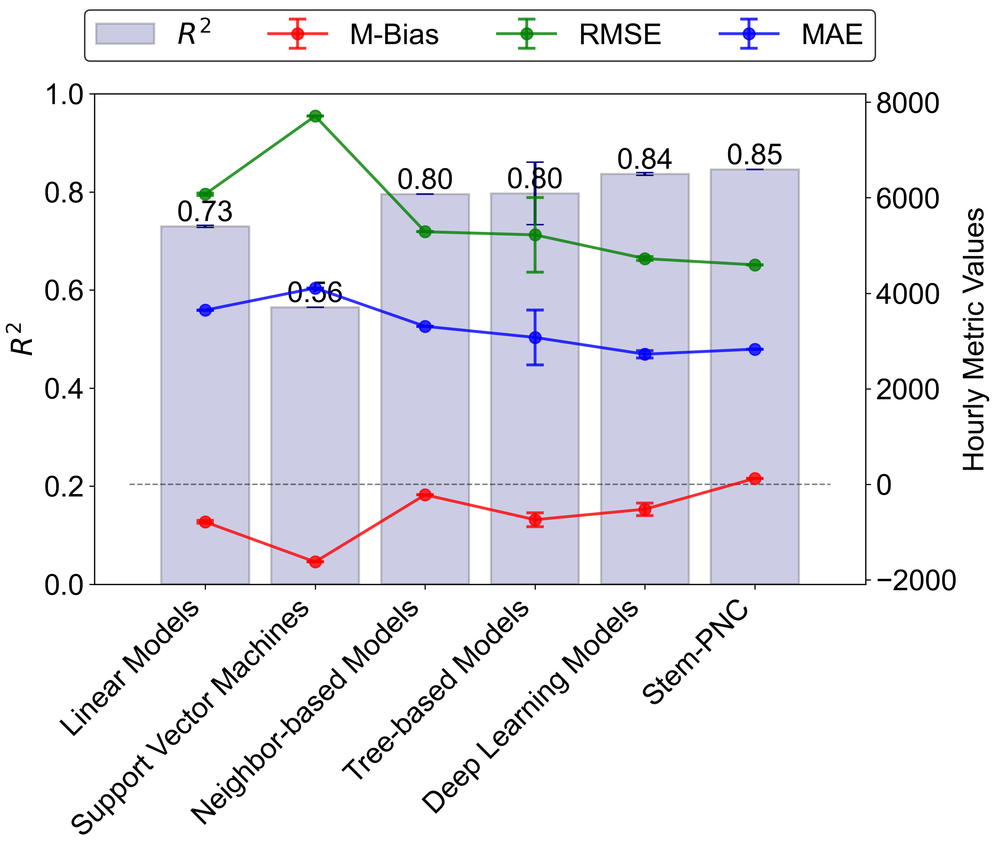

In [30]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20
fig, ax1 = plt.subplots(dpi=300, figsize=(10, 9))

# R2 plot
bars = ax1.bar(model_type_means['model_type'], model_type_means['r2'], yerr=model_type_std['r2'], 
               alpha=0.2, color='navy',
               label=r'${R^2}$', edgecolor='black', linewidth=1.5,
               error_kw=dict(ecolor='navy', elinewidth=2, capsize=6, capthick=1))

# Adding data labels for the bars
for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width() / 2, height, '{:.2f}'.format(height),
             ha='center', va='bottom', color='black')
ax1.set_xticks(model_type_means['model_type'])
ax1.set_xticklabels(model_type_means['model_type'], rotation=45, ha='right')
ax1.set_ylabel(r'${R^2}$')
ax1.set_ylim(0, 1)

# Bias plot
ax2 = ax1.twinx()
ax2.errorbar(model_type_means['model_type'], model_type_means['bias'], yerr=model_type_std['bias'],
                fmt='ro-', label='M-Bias', linewidth=2, alpha=0.8, markersize=8, capsize=6, capthick=2)
ax2.errorbar(model_type_means['model_type'], model_type_means['RMSE'], yerr=model_type_std['RMSE'],
                fmt='go-', label='RMSE', linewidth=2, alpha=0.8, markersize=8, capsize=6, capthick=2)
ax2.errorbar(model_type_means['model_type'], model_type_means['mae'], yerr=model_type_std['mae'],
                fmt='bo-', label='MAE', linewidth=2, alpha=0.8, markersize=8, capsize=6, capthick=2)

xlim = ax2.get_xlim()
x = np.linspace(xlim[0], xlim[1], len(model_type_means['model_type']))
ax2.plot(x, np.zeros_like(x), 'k--', linewidth=1, alpha=0.5)
# ax2.plot(model_type_means['model_type'], np.zeros((len(model_type_means['model_type']), 1)), 'k--', linewidth=1, alpha=0.5)

ax2.set_ylabel('Hourly Metric Values')
ax2.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Combining the legends from both the plots and placing it on top of the figure
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='upper center',
           ncol=4, edgecolor='black',
           bbox_to_anchor=(0.5, 1.2))

plt.tight_layout()
plt.savefig('./figure/results_bar.png', dpi=600, bbox_inches='tight')
plt.show()

- plot time

In [31]:
# time calculate
def date_cal(df, date_type):
    def add_suffix(df, suffix):
        return df.add_suffix(suffix)

    # get all numeric columns except 'station' and convert them to float
    float_cols = df.columns.drop('station')
    df[float_cols] = df[float_cols].astype(float)
    results = pd.DataFrame()

    for station in df['station'].unique():
        station_df = df[df['station'] == station].drop('station', axis=1)

        if date_type == 'D':
            mean = add_suffix(station_df.resample('D').mean(), '_mean')
            std = add_suffix(station_df.resample('D').std(), '_std')
        elif date_type == 'W':
            mean = add_suffix(station_df.resample('W').mean(), '_mean')
            std = add_suffix(station_df.resample('W').std(), '_std')
        elif date_type == 'M':
            mean = add_suffix(station_df.resample('M').mean(), '_mean')
            std = add_suffix(station_df.resample('M').std(), '_std')
        elif date_type == 'Q':
            mean = add_suffix(station_df.resample('Q').mean(), '_mean')
            std = add_suffix(station_df.resample('Q').std(), '_std')
        
        station_results = pd.concat([mean, std], axis=1)
        station_results['station'] = station  # 添加站点标识
        results = pd.concat([results, station_results])

    results = results.reset_index().set_index(['Date/time', 'station'])
    # sort by 'Date/time' and 'station'
    results.sort_index(level=['Date/time', 'station'], inplace=True)
    
    return results

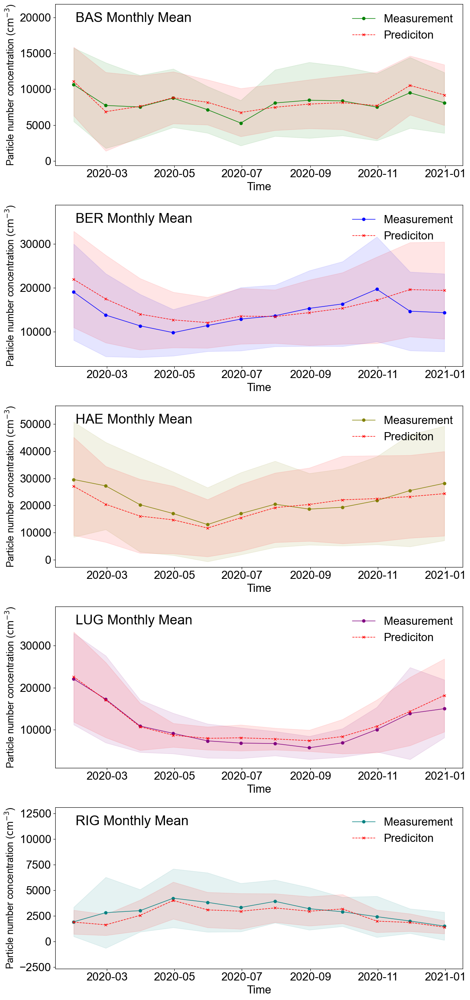

In [32]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1128.csv')
pnc_pred2020  = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_data_pred = pnc_pred2020[['Date/time', 'station', 'CPC [1/cm3]', 'linear_pred',
                               'lasso_pred',  'svm_pred', 'knn_pred', 'tree_pred',
                               'rf_pred', 'ada_pred', 'gbr_pred', 'lgb_pred', 'stack_pred']]
pnc_data_pred['Date/time'] = pd.to_datetime(pnc_data_pred['Date/time'])
df = pnc_data_pred.set_index('Date/time')
# result = date_cal(df, 'D')
# result = date_cal(df, 'W')
result = date_cal(df, 'M')
result.dropna(inplace=True)
result.reset_index(inplace=True)
data_df = result

models = ['stack_pred']
stations = data_df['station'].unique()
colors = ['green', 'blue', 'olive', 'purple', 'teal']

plt.figure(figsize=(12, 25), dpi=100)

for idx, station in enumerate(stations):
    station_data = data_df[data_df['station'] == station]
    # plt.figure(figsize=(12, 5), dpi=300)
    plt.subplot(5, 1, idx+1)
    solid_color = colors[idx % len(colors)]
    
    plt.plot(station_data['Date/time'], station_data['CPC [1/cm3]_mean'], marker='o',
             label=f'Measurement',
             color=solid_color, linestyle='-', linewidth=1, markersize=5)
    upper_bound = station_data['CPC [1/cm3]_mean'] + station_data['CPC [1/cm3]_std']
    lower_bound = station_data['CPC [1/cm3]_mean'] - station_data['CPC [1/cm3]_std']
    plt.fill_between(station_data['Date/time'], lower_bound, upper_bound, color=solid_color, alpha=0.1)
    

    for model in models:
        model_mean_column = f'{model}_mean'
        model_std_column = f'{model}_std'

        if model_mean_column in station_data.columns:
            plt.plot(station_data['Date/time'], station_data[model_mean_column], 'x',
                     label=f'Prediciton', linestyle='--', color='r', linewidth=1, markersize=5)
            stacking_upper_bound = station_data[model_mean_column] + station_data[model_std_column]
            stacking_lower_bound = station_data[model_mean_column] - station_data[model_std_column]
            plt.fill_between(station_data['Date/time'], stacking_lower_bound, stacking_upper_bound, color='r',
                             alpha=0.1)

    y_min = min(min(lower_bound), min(stacking_lower_bound))-2000
    y_max = max(max(upper_bound), max(stacking_upper_bound))+6000
    plt.xlabel("Time", fontsize=20)
    plt.ylabel(r"Particle number concentration ($\mathrm{cm}^{-3}$)", fontsize=17)
    plt.ylim(y_min, y_max)
    plt.legend(loc='upper right', ncol=1,
               fontsize=20, edgecolor='black', frameon=False)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = station + ' Monthly Mean', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    # plt.tight_layout()
    # plt.savefig('../SI_figure/S1/pred_plot_Monthly_'+ station +'.png', dpi=600, bbox_inches='tight')
    # plt.show()

plt.tight_layout()
plt.savefig('../SI_figure/S1/pred_plot_Monthly.png', dpi=600, bbox_inches='tight')
plt.show()

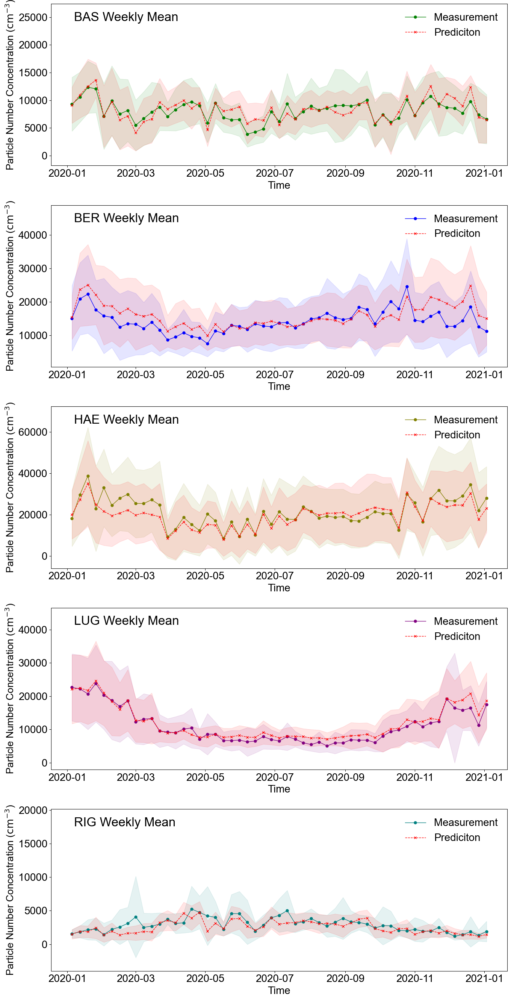

In [184]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1128.csv')
pnc_pred2020  = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_data_pred = pnc_pred2020[['Date/time', 'station', 'CPC [1/cm3]', 'linear_pred',
                               'lasso_pred',  'svm_pred', 'knn_pred', 'tree_pred',
                               'rf_pred', 'ada_pred', 'gbr_pred', 'lgb_pred', 'stack_pred']]
pnc_data_pred['Date/time'] = pd.to_datetime(pnc_data_pred['Date/time'])
df = pnc_data_pred.set_index('Date/time')
# result = date_cal(df, 'D')
result = date_cal(df, 'W')
# result = date_cal(df, 'M')
result.dropna(inplace=True)
result.reset_index(inplace=True)
data_df = result

models = ['stack_pred']
stations = data_df['station'].unique()
colors = ['green', 'blue', 'olive', 'purple', 'teal']

plt.figure(figsize=(14, 27), dpi=100)

for idx, station in enumerate(stations):
    station_data = data_df[data_df['station'] == station]
    # plt.figure(figsize=(12, 5), dpi=300)
    plt.subplot(5, 1, idx+1)
    solid_color = colors[idx % len(colors)]
    
    plt.plot(station_data['Date/time'], station_data['CPC [1/cm3]_mean'], marker='o',
             label=f'Measurement',
             color=solid_color, linestyle='-', linewidth=1, markersize=5)
    upper_bound = station_data['CPC [1/cm3]_mean'] + station_data['CPC [1/cm3]_std']
    lower_bound = station_data['CPC [1/cm3]_mean'] - station_data['CPC [1/cm3]_std']
    plt.fill_between(station_data['Date/time'], lower_bound, upper_bound, color=solid_color, alpha=0.1)
    

    for model in models:
        model_mean_column = f'{model}_mean'
        model_std_column = f'{model}_std'

        if model_mean_column in station_data.columns:
            plt.plot(station_data['Date/time'], station_data[model_mean_column], 'x',
                     label=f'Prediciton', linestyle='--', color='r',
                     linewidth=1, markersize=5)
            stacking_upper_bound = station_data[model_mean_column] + station_data[model_std_column]
            stacking_lower_bound = station_data[model_mean_column] - station_data[model_std_column]
            plt.fill_between(station_data['Date/time'], stacking_lower_bound, stacking_upper_bound,
                             color='r', alpha=0.1)

    y_min = min(min(lower_bound), min(stacking_lower_bound))-2000
    y_max = max(max(upper_bound), max(stacking_upper_bound))+10000
    plt.xlabel("Time", fontsize=20)
    plt.ylabel(r"Particle Number Concentration ($\mathrm{cm}^{-3}$)", fontsize=19)
    plt.ylim(y_min, y_max)
    plt.legend(loc='upper right', ncol=1,
               fontsize=20, edgecolor='black', frameon=False)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = station + ' Weekly Mean', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)

    # plt.tight_layout()
    # plt.savefig('./figure/pred_plot_Weekly_'+ station +'.png', dpi=600)
    # plt.show()
plt.tight_layout()
plt.savefig('./figure/pred_plot_Weekly.png', dpi=600)
plt.show()

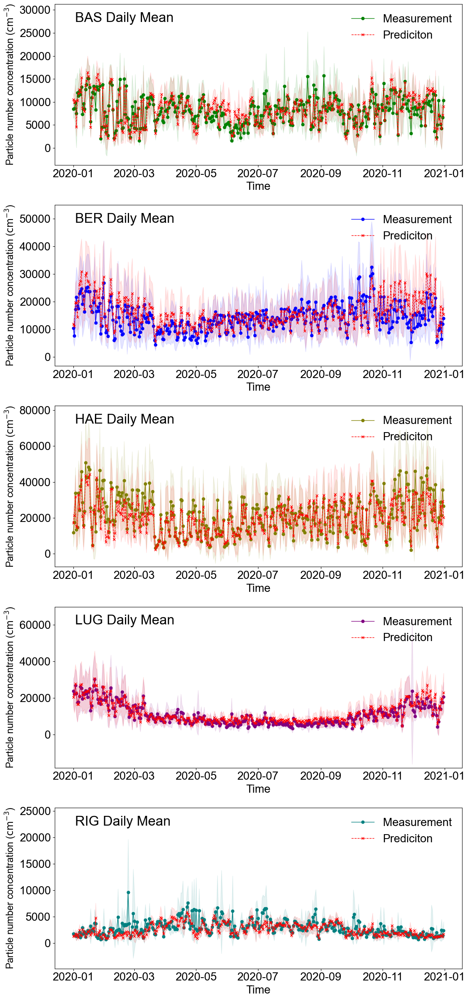

In [186]:
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1128.csv')
pnc_pred2020  = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_data_pred = pnc_pred2020[['Date/time', 'station', 'CPC [1/cm3]', 'linear_pred',
                               'lasso_pred',  'svm_pred', 'knn_pred', 'tree_pred',
                               'rf_pred', 'ada_pred', 'gbr_pred', 'lgb_pred', 'stack_pred']]
pnc_data_pred['Date/time'] = pd.to_datetime(pnc_data_pred['Date/time'])
df = pnc_data_pred.set_index('Date/time')
result = date_cal(df, 'D')
# result = date_cal(df, 'W')
# result = date_cal(df, 'M')
result.dropna(inplace=True)
result.reset_index(inplace=True)
data_df = result

models = ['stack_pred']
stations = data_df['station'].unique()
colors = ['green', 'blue', 'olive', 'purple', 'teal']

plt.figure(figsize=(12, 25), dpi=100)

for idx, station in enumerate(stations):
    station_data = data_df[data_df['station'] == station]
    # plt.figure(figsize=(12, 5), dpi=300)
    plt.subplot(5, 1, idx+1)
    solid_color = colors[idx % len(colors)]
    
    plt.plot(station_data['Date/time'], station_data['CPC [1/cm3]_mean'], marker='o',
             label=f'Measurement',
             color=solid_color, linestyle='-', linewidth=1, markersize=5)
    upper_bound = station_data['CPC [1/cm3]_mean'] + station_data['CPC [1/cm3]_std']
    lower_bound = station_data['CPC [1/cm3]_mean'] - station_data['CPC [1/cm3]_std']
    plt.fill_between(station_data['Date/time'], lower_bound, upper_bound, color=solid_color, alpha=0.1)
    

    for model in models:
        model_mean_column = f'{model}_mean'
        model_std_column = f'{model}_std'

        if model_mean_column in station_data.columns:
            plt.plot(station_data['Date/time'], station_data[model_mean_column], 'x',
                     label=f'Prediciton', linestyle='--', color='r', linewidth=1, markersize=5)
            stacking_upper_bound = station_data[model_mean_column] + station_data[model_std_column]
            stacking_lower_bound = station_data[model_mean_column] - station_data[model_std_column]
            plt.fill_between(station_data['Date/time'], stacking_lower_bound, stacking_upper_bound, color='r',
                             alpha=0.1)

    y_min = min(min(lower_bound), min(stacking_lower_bound))-2000
    y_max = max(max(upper_bound), max(stacking_upper_bound))+6000
    plt.xlabel("Time", fontsize=20)
    plt.ylabel(r"Particle number concentration ($\mathrm{cm}^{-3}$)", fontsize=17)
    plt.ylim(y_min, y_max)
    plt.legend(loc='upper right', ncol=1,
               fontsize=20, edgecolor='black', frameon=False)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = station + ' Daily Mean', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    # plt.tight_layout()
    # plt.savefig('../SI_figure/S1/pred_plot_Monthly_'+ station +'.png', dpi=600, bbox_inches='tight')
    # plt.show()

plt.tight_layout()
plt.savefig('../SI_figure/S1/pred_plot_Daily.png', dpi=600, bbox_inches='tight')
plt.show()

- scatter

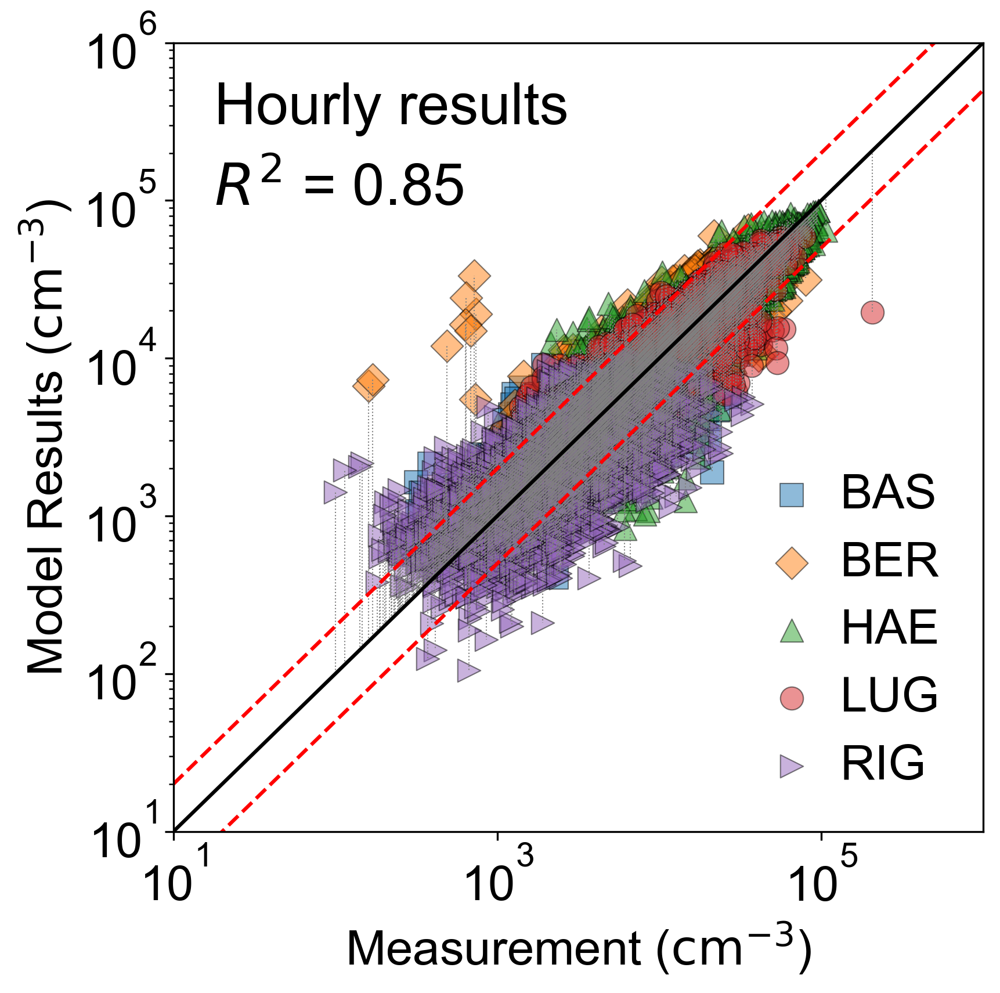

In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
marker_size = 90

min_temp, max_temp = 10, 1000000

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1203.csv')
pnc_pred2020 = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_data_pred = pnc_pred2020

for col in pnc_data_pred.filter(like='stack_pred'):
    model_name = col.split('_')[0]
    plt.figure(figsize=(6, 6), dpi=300)
    colors = sns.color_palette("tab10", n_colors=len(stations))
    
    for station, color, marker in zip(stations, colors, markers):
        subset = pnc_data_pred[pnc_data_pred['station'] == station]
        plt.scatter(subset['CPC [1/cm3]'], subset[col], label=station, color=color, alpha=0.5, edgecolors='k',
                    s=marker_size, marker=marker, linewidths=0.5)
        plt.vlines(subset['CPC [1/cm3]'], subset['CPC [1/cm3]'], subset[col], color='grey',
                   linestyle='dotted', lw=0.5)

    plt.xscale('log')
    plt.yscale('log')

    # Linear fit with logarithmic scale
    X = pnc_data_pred['CPC [1/cm3]']
    y = pnc_data_pred[col]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    # coefficients = model.params
    # r2
    coefficients = r2_score(pnc_data_pred['CPC [1/cm3]'], pnc_data_pred[col])
    
    # y=x line on log-log scale
    plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')

    # Add upper and lower bounds, usually twice the actual value and half the actual value
    upper_bound = 2 * np.array([min_temp, max_temp])
    lower_bound = 0.5 * np.array([min_temp, max_temp])
    plt.plot([min_temp, max_temp], upper_bound, 'r--')
    plt.plot([min_temp, max_temp], lower_bound, 'r--')

    plt.xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.xlim([min_temp, max_temp])
    plt.ylim([min_temp, max_temp])
    plt.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = r'Hourly results', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    plt.text(x=0.05, y=0.85, s = f'$R^2$ = {coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    # plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig('./figure/stack_CPCvsPNC_log_scatter_hourly.png', dpi=600, bbox_inches='tight')
    plt.show()

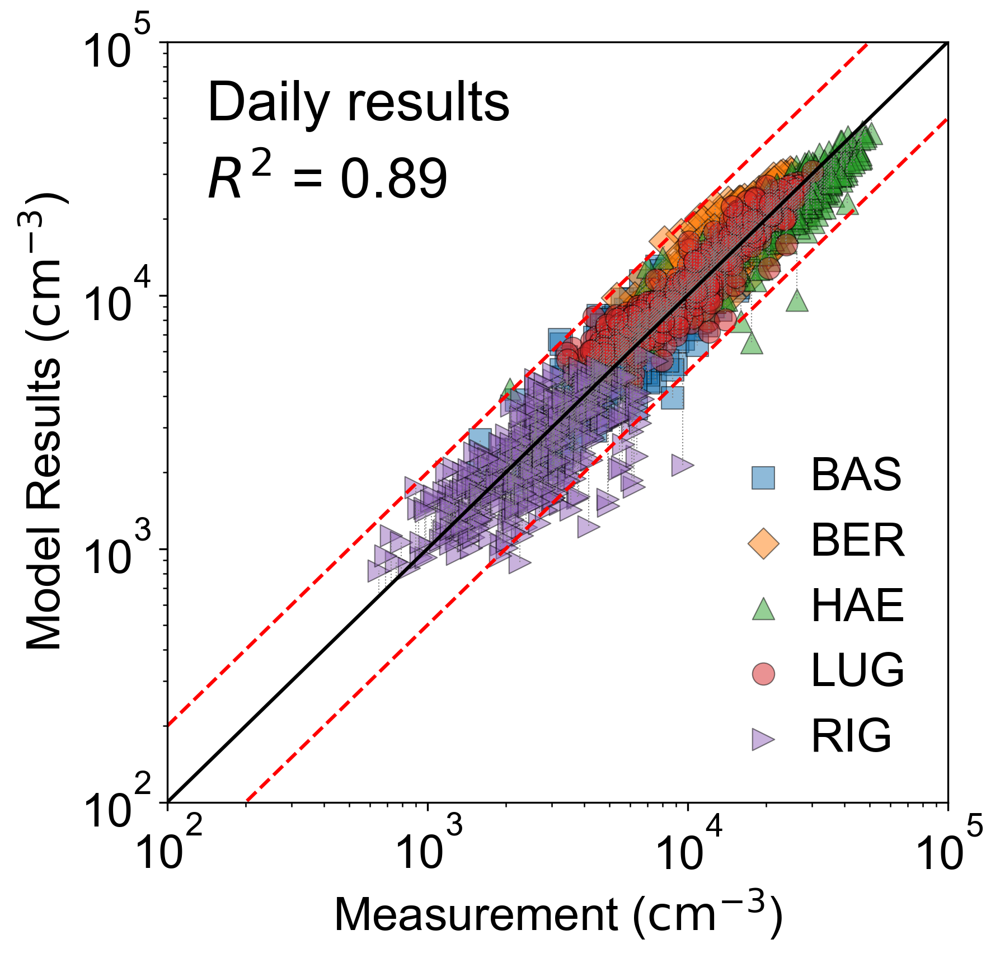

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 100, 100000

stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
marker_size = 90

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1203.csv')
pnc_pred2020 = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_pred2020['date'] = pd.to_datetime(pnc_pred2020['Date/time']).dt.date
pnc_pred2020 = pnc_pred2020.drop(columns=['Date/time'])
pnc_pred2020 = pnc_pred2020.groupby([pnc_pred2020['date'], 'station']).mean().reset_index()
pnc_data_pred = pnc_pred2020

for col in pnc_data_pred.filter(like='stack_pred'):
    model_name = col.split('_')[0]
    plt.figure(figsize=(6, 6), dpi=300)
    colors = sns.color_palette("tab10", n_colors=len(stations))
    
    for station, color, marker in zip(stations, colors, markers):
        subset = pnc_data_pred[pnc_data_pred['station'] == station]
        plt.scatter(subset['CPC [1/cm3]'], subset[col], label=station, color=color, alpha=0.5, edgecolors='k',
                    s=marker_size, marker=marker, linewidths=0.5)
        plt.vlines(subset['CPC [1/cm3]'], subset['CPC [1/cm3]'], subset[col], color='grey',
                   linestyle='dotted', lw=0.5)

    plt.xscale('log')
    plt.yscale('log')

    # Linear fit with logarithmic scale
    X = pnc_data_pred['CPC [1/cm3]']
    y = pnc_data_pred[col]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    # coefficients = model.params
    # r2
    coefficients = r2_score(pnc_data_pred['CPC [1/cm3]'], pnc_data_pred[col])

    # y=x line on log-log scale
    plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')

    # Add upper and lower bounds, usually twice the actual value and half the actual value
    upper_bound = 2 * np.array([min_temp, max_temp])
    lower_bound = 0.5 * np.array([min_temp, max_temp])
    plt.plot([min_temp, max_temp], upper_bound, 'r--')
    plt.plot([min_temp, max_temp], lower_bound, 'r--')

    plt.xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.xlim(min_temp, max_temp)
    plt.ylim(min_temp, max_temp)
    plt.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = r'Daily results', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    plt.text(x=0.05, y=0.85, s = f'$R^2$ = {coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    # plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig('./figure/stack_CPCvsPNC_log_scatter_daily.png', dpi=600, bbox_inches='tight')
    plt.show()


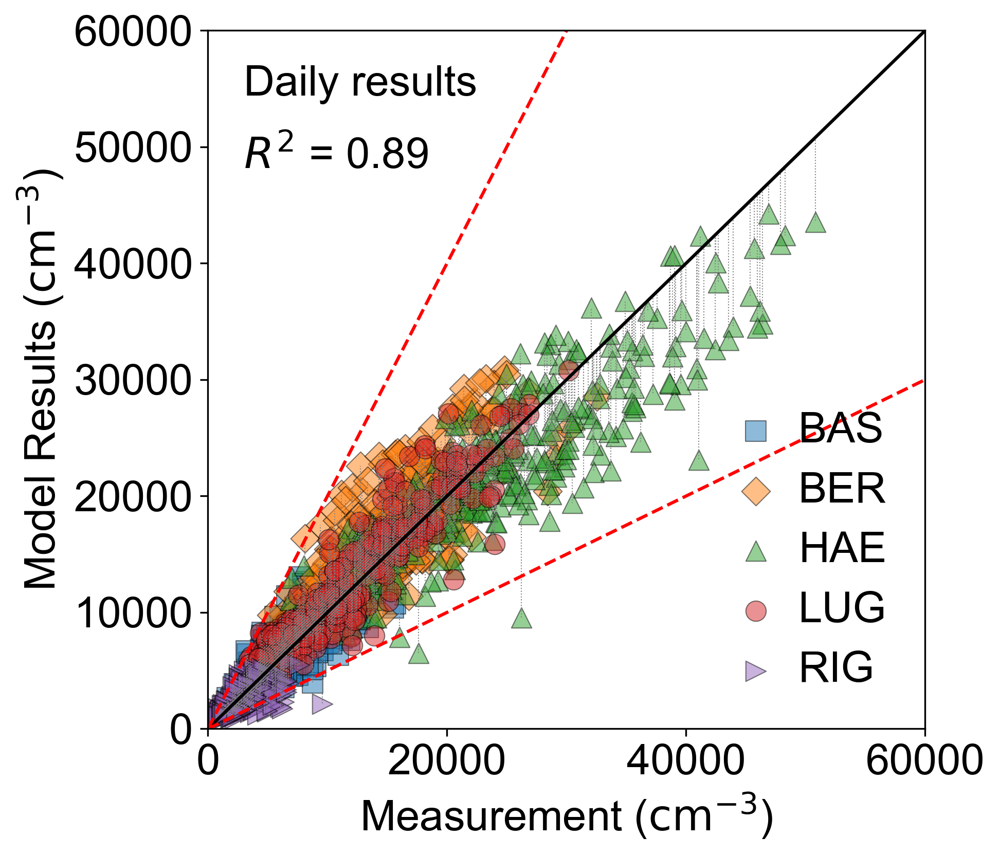

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 0, 60000

stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
marker_size = 90

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1203.csv')
pnc_pred2020 = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_pred2020['date'] = pd.to_datetime(pnc_pred2020['Date/time']).dt.date
pnc_pred2020 = pnc_pred2020.drop(columns=['Date/time'])
pnc_pred2020 = pnc_pred2020.groupby([pnc_pred2020['date'], 'station']).mean().reset_index()
pnc_data_pred = pnc_pred2020

for col in pnc_data_pred.filter(like='stack_pred'):
    model_name = col.split('_')[0]
    plt.figure(figsize=(6, 6), dpi=300)
    colors = sns.color_palette("tab10", n_colors=len(stations))
    
    for station, color, marker in zip(stations, colors, markers):
        subset = pnc_data_pred[pnc_data_pred['station'] == station]
        plt.scatter(subset['CPC [1/cm3]'], subset[col], label=station, color=color, alpha=0.5, edgecolors='k',
                    s=marker_size, marker=marker, linewidths=0.5)
        plt.vlines(subset['CPC [1/cm3]'], subset['CPC [1/cm3]'], subset[col],
                   color='grey', linestyle='dotted', lw=0.5)

    # Linear fit with logarithmic scale
    X = pnc_data_pred['CPC [1/cm3]']
    y = pnc_data_pred[col]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    # coefficients = model.params
    # r2
    coefficients = r2_score(pnc_data_pred['CPC [1/cm3]'], pnc_data_pred[col])

    # y=x line on log-log scale
    plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')

    # Add upper and lower bounds, usually twice the actual value and half the actual value
    upper_bound = 2 * np.array([min_temp, max_temp])
    lower_bound = 0.5 * np.array([min_temp, max_temp])
    plt.plot([min_temp, max_temp], upper_bound, 'r--')
    plt.plot([min_temp, max_temp], lower_bound, 'r--')

    plt.xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.xlim(min_temp, max_temp)
    plt.ylim(min_temp, max_temp)
    plt.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = r'Daily results', verticalalignment='top', horizontalalignment='left',
             fontsize=20, transform=ax.transAxes)
    # [1]
    plt.text(x=0.05, y=0.85, s = f'$R^2$ = {coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
             fontsize=20, transform=ax.transAxes)
    # plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig('../SI_figure/S1/stack_CPCvsPNC_scatter_daily.png', dpi=600, bbox_inches='tight')
    plt.show()


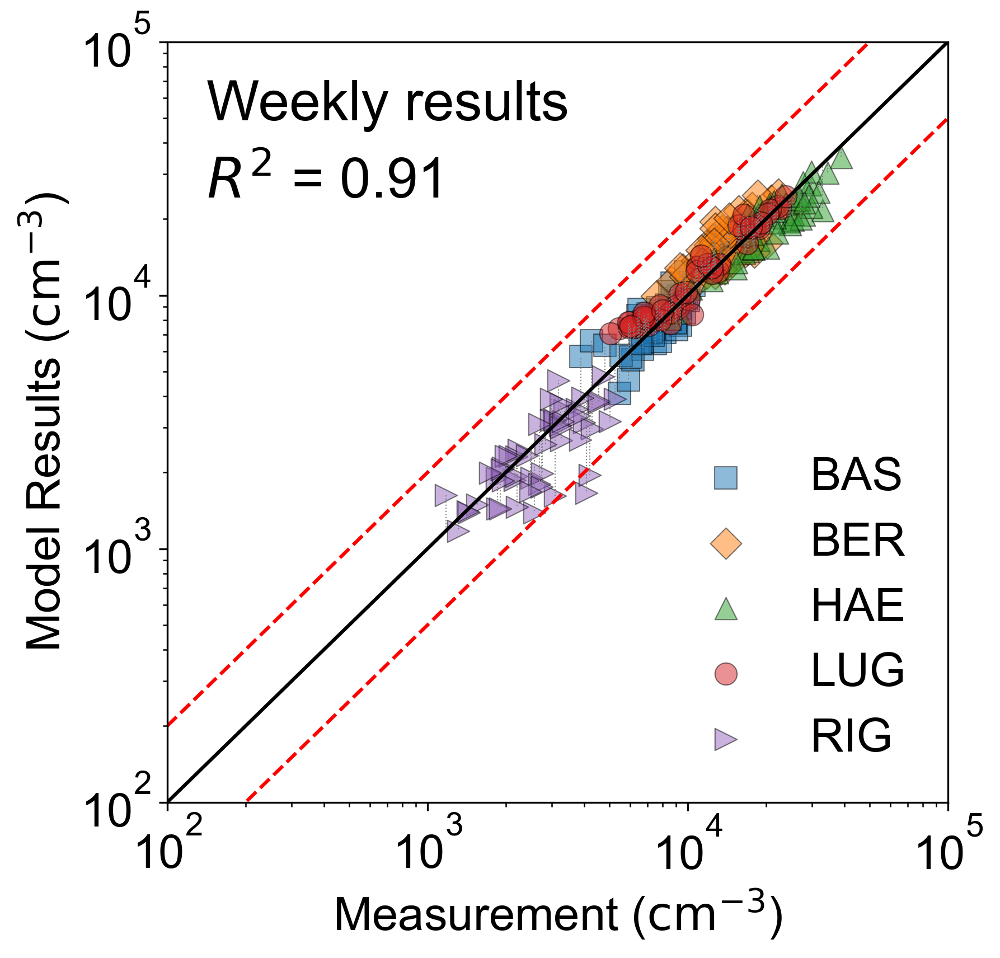

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 100, 100000

stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
marker_size = 90

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1203.csv')
pnc_pred2020 = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_pred2020.index = pd.to_datetime(pnc_pred2020['Date/time'])
pnc_pred2020 = pnc_pred2020.drop(columns=['Date/time'])
pnc_pred2020 = pnc_pred2020.groupby('station').resample('W').mean()
pnc_pred2020 = pnc_pred2020.reset_index()
pnc_pred2020['week_year'] = pnc_pred2020['Date/time'].dt.strftime('%Y-%W')
pnc_pred2020 = pnc_pred2020.groupby(['week_year', 'station']).mean().reset_index()
pnc_data_pred = pnc_pred2020

for col in pnc_data_pred.filter(like='stack_pred'):
    model_name = col.split('_')[0]
    plt.figure(figsize=(6, 6), dpi=300)
    colors = sns.color_palette("tab10", n_colors=len(stations))
    
    for station, color, marker in zip(stations, colors, markers):
        subset = pnc_data_pred[pnc_data_pred['station'] == station]
        plt.scatter(subset['CPC [1/cm3]'], subset[col], label=station, color=color, alpha=0.5, edgecolors='k',
                    s=marker_size, marker=marker, linewidths=0.5)
        plt.vlines(subset['CPC [1/cm3]'], subset['CPC [1/cm3]'], subset[col],
                   color='grey', linestyle='dotted', lw=0.5)

    plt.xscale('log')
    plt.yscale('log')

    # Linear fit with logarithmic scale
    X = np.log(pnc_data_pred['CPC [1/cm3]'])
    y = np.log(pnc_data_pred[col])
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    # coefficients = model.params
    # r2
    coefficients = r2_score(pnc_data_pred['CPC [1/cm3]'], pnc_data_pred[col])

    # y=x line on log-log scale
    plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')

    # Add upper and lower bounds, usually twice the actual value and half the actual value
    upper_bound = 2 * np.array([min_temp, max_temp])
    lower_bound = 0.5 * np.array([min_temp, max_temp])
    plt.plot([min_temp, max_temp], upper_bound, 'r--')
    plt.plot([min_temp, max_temp], lower_bound, 'r--')

    plt.xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.xlim(min_temp, max_temp)
    plt.ylim(min_temp, max_temp)
    plt.legend(loc='lower right', frameon=False)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = r'Weekly results', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    plt.text(x=0.05, y=0.85, s = f'$R^2$ = {coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    # plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig('./figure/stack_CPCvsPNC_log_scatter_weekly.png', dpi=600, bbox_inches='tight')
    plt.show()


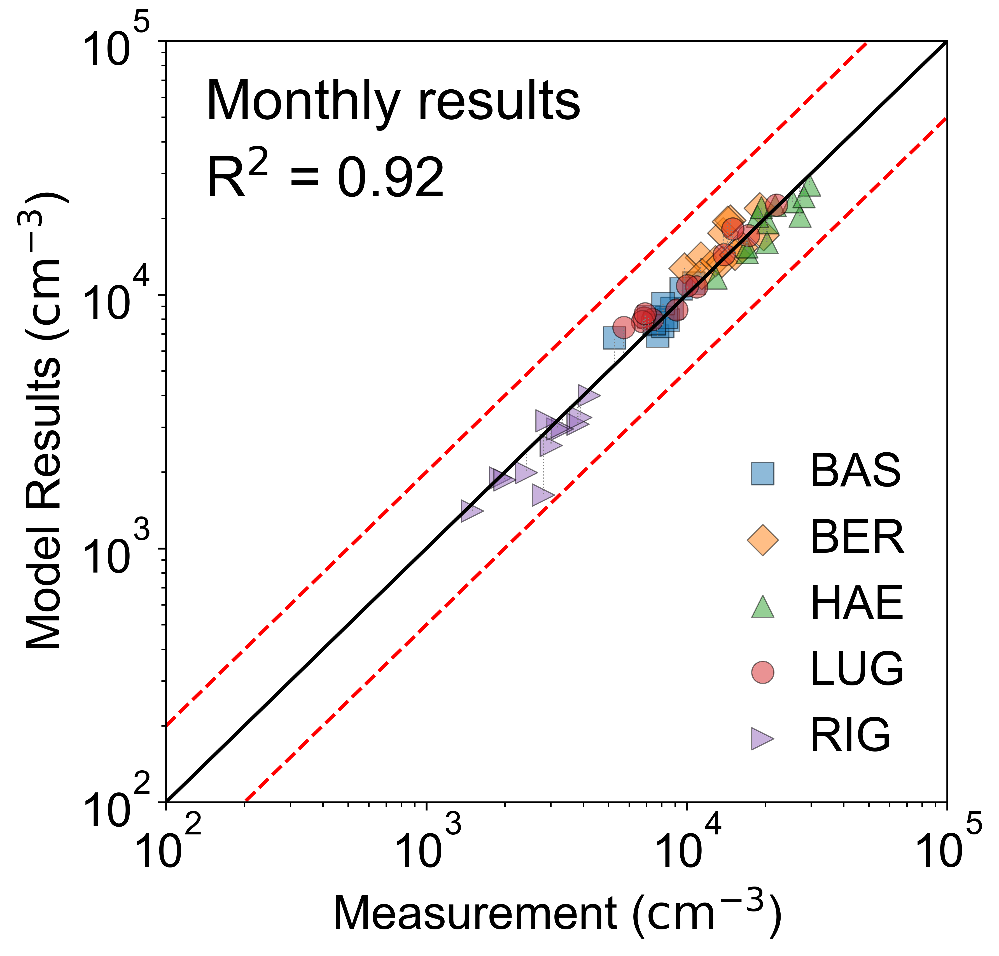

In [188]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 100, 100000

stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
marker_size = 90

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1203.csv')
pnc_pred2020 = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_pred2020['month_year'] = pd.to_datetime(pnc_pred2020['Date/time']).dt.date.apply(lambda x: x.strftime('%Y-%m'))
pnc_pred2020 = pnc_pred2020.drop(columns=['Date/time'])
pnc_pred2020 = pnc_pred2020.groupby([pnc_pred2020['month_year'], 'station']).mean().reset_index()
pnc_data_pred = pnc_pred2020

for col in pnc_data_pred.filter(like='stack_pred'):
    model_name = col.split('_')[0]
    plt.figure(figsize=(6, 6), dpi=300)
    colors = sns.color_palette("tab10", n_colors=len(stations))
    
    for station, color, marker in zip(stations, colors, markers):
        subset = pnc_data_pred[pnc_data_pred['station'] == station]
        plt.scatter(subset['CPC [1/cm3]'], subset[col], label=station, color=color, alpha=0.5, edgecolors='k',
                    s=marker_size, marker=marker, linewidths=0.5)
        plt.vlines(subset['CPC [1/cm3]'], subset['CPC [1/cm3]'], subset[col],
                   color='grey', linestyle='dotted', lw=0.5)

    plt.xscale('log')
    plt.yscale('log')

    # Linear fit with logarithmic scale
    X = np.log(pnc_data_pred['CPC [1/cm3]'])
    y = np.log(pnc_data_pred[col])
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    # coefficients = model.params
    # r2
    coefficients = r2_score(pnc_data_pred['CPC [1/cm3]'], pnc_data_pred[col])

    # y=x line on log-log scale
    plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')

    # Add upper and lower bounds, usually twice the actual value and half the actual value
    upper_bound = 2 * np.array([min_temp, max_temp])
    lower_bound = 0.5 * np.array([min_temp, max_temp])
    plt.plot([min_temp, max_temp], upper_bound, 'r--')
    plt.plot([min_temp, max_temp], lower_bound, 'r--')

    # plt.xlabel(r"True PNC ($\# \cdot cm^{-3}$)", fontsize=20)
    # plt.ylabel(r"Predicted PNC ($\# \cdot cm^{-3}$)", fontsize=20)
    plt.xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.xlim(min_temp, max_temp)
    plt.ylim(min_temp, max_temp)
    plt.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = r'Monthly results', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    plt.text(x=0.05, y=0.85, s = f'R$^2$ = {coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
             fontsize=24, transform=ax.transAxes)
    # plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig('./figure/stack_CPCvsPNC_log_scatter_Monthly.png', dpi=600, bbox_inches='tight')
    plt.show()


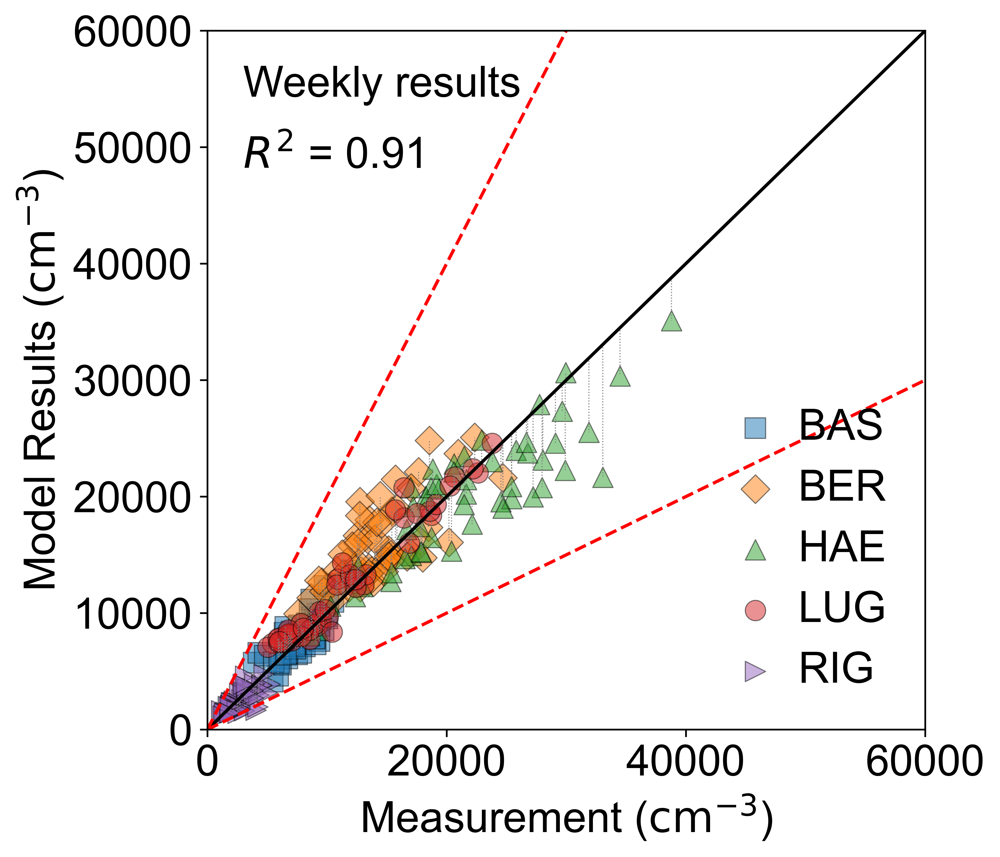

In [192]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 0, 60000

stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
marker_size = 90

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1203.csv')
pnc_pred2020 = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_pred2020.index = pd.to_datetime(pnc_pred2020['Date/time'])
pnc_pred2020 = pnc_pred2020.drop(columns=['Date/time'])
pnc_pred2020 = pnc_pred2020.groupby('station').resample('W').mean()
pnc_pred2020 = pnc_pred2020.reset_index()
pnc_pred2020['week_year'] = pnc_pred2020['Date/time'].dt.strftime('%Y-%W')
pnc_pred2020 = pnc_pred2020.groupby(['week_year', 'station']).mean().reset_index()
pnc_data_pred = pnc_pred2020

for col in pnc_data_pred.filter(like='stack_pred'):
    model_name = col.split('_')[0]
    plt.figure(figsize=(6, 6), dpi=300)
    colors = sns.color_palette("tab10", n_colors=len(stations))
    
    for station, color, marker in zip(stations, colors, markers):
        subset = pnc_data_pred[pnc_data_pred['station'] == station]
        plt.scatter(subset['CPC [1/cm3]'], subset[col], label=station, color=color, alpha=0.5, edgecolors='k',
                    s=marker_size, marker=marker, linewidths=0.5)
        plt.vlines(subset['CPC [1/cm3]'], subset['CPC [1/cm3]'], subset[col],
                   color='grey', linestyle='dotted', lw=0.5)

    # Linear fit with logarithmic scale
    X = pnc_data_pred['CPC [1/cm3]']
    y = pnc_data_pred[col]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    # coefficients = model.params
    # r2
    coefficients = r2_score(pnc_data_pred['CPC [1/cm3]'], pnc_data_pred[col])

    # y=x line on log-log scale
    plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')

    # Add upper and lower bounds, usually twice the actual value and half the actual value
    upper_bound = 2 * np.array([min_temp, max_temp])
    lower_bound = 0.5 * np.array([min_temp, max_temp])
    plt.plot([min_temp, max_temp], upper_bound, 'r--')
    plt.plot([min_temp, max_temp], lower_bound, 'r--')

    plt.xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.xlim(min_temp, max_temp)
    plt.ylim(min_temp, max_temp)
    plt.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = r'Weekly results', verticalalignment='top', horizontalalignment='left',
             fontsize=20, transform=ax.transAxes)
    # [1]
    plt.text(x=0.05, y=0.85, s = f'$R^2$ = {coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
             fontsize=20, transform=ax.transAxes)
    # plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig('../SI_figure/S1/stack_CPCvsPNC_scatter_weekly.png', dpi=600, bbox_inches='tight')
    plt.show()


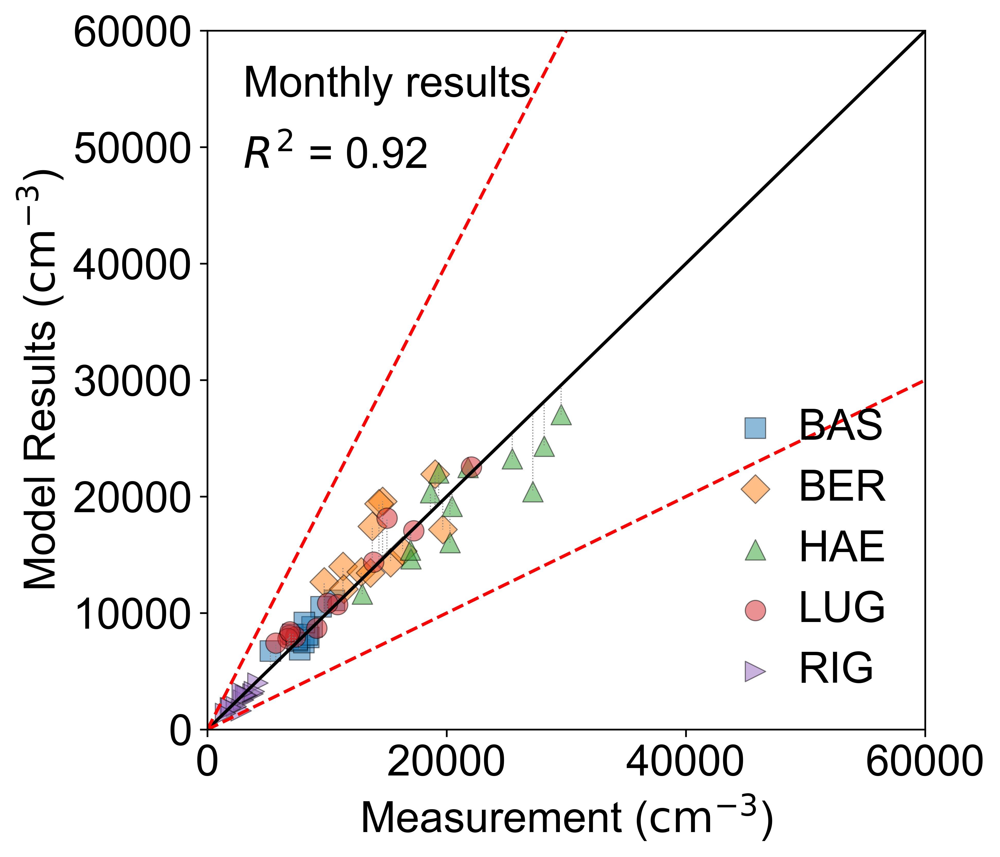

In [193]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 0, 60000

stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
marker_size = 90

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/pncdata2020_pred1203.csv')
pnc_pred2020 = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_pred2020['month_year'] = pd.to_datetime(pnc_pred2020['Date/time']).dt.date.apply(lambda x: x.strftime('%Y-%m'))
pnc_pred2020 = pnc_pred2020.drop(columns=['Date/time'])
pnc_pred2020 = pnc_pred2020.groupby([pnc_pred2020['month_year'], 'station']).mean().reset_index()
pnc_data_pred = pnc_pred2020

for col in pnc_data_pred.filter(like='stack_pred'):
    model_name = col.split('_')[0]
    plt.figure(figsize=(6, 6), dpi=600)
    colors = sns.color_palette("tab10", n_colors=len(stations))
    
    for station, color, marker in zip(stations, colors, markers):
        subset = pnc_data_pred[pnc_data_pred['station'] == station]
        plt.scatter(subset['CPC [1/cm3]'], subset[col], label=station, color=color, alpha=0.5, edgecolors='k',
                    s=marker_size, marker=marker, linewidths=0.5)
        plt.vlines(subset['CPC [1/cm3]'], subset['CPC [1/cm3]'], subset[col],
                   color='grey', linestyle='dotted', lw=0.5)

    # Linear fit with logarithmic scale
    X = pnc_data_pred['CPC [1/cm3]']
    y = pnc_data_pred[col]
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    # coefficients = model.params
    # r2
    coefficients = r2_score(pnc_data_pred['CPC [1/cm3]'], pnc_data_pred[col])

    # y=x line on log-log scale
    plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')

    # Add upper and lower bounds, usually twice the actual value and half the actual value
    upper_bound = 2 * np.array([min_temp, max_temp])
    lower_bound = 0.5 * np.array([min_temp, max_temp])
    plt.plot([min_temp, max_temp], upper_bound, 'r--')
    plt.plot([min_temp, max_temp], lower_bound, 'r--')

    plt.xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
    plt.xlim(min_temp, max_temp)
    plt.ylim(min_temp, max_temp)
    plt.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
    ax = plt.gca()
    plt.text(x=0.05, y=0.95, s = r'Monthly results', verticalalignment='top', horizontalalignment='left',
             fontsize=20, transform=ax.transAxes)
    # [1]
    plt.text(x=0.05, y=0.85, s = f'$R^2$ = {coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
             fontsize=20, transform=ax.transAxes)
    # plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig('../SI_figure/S1/stack_CPCvsPNC_scatter_monthly.png', dpi=600, bbox_inches='tight')
    plt.show()


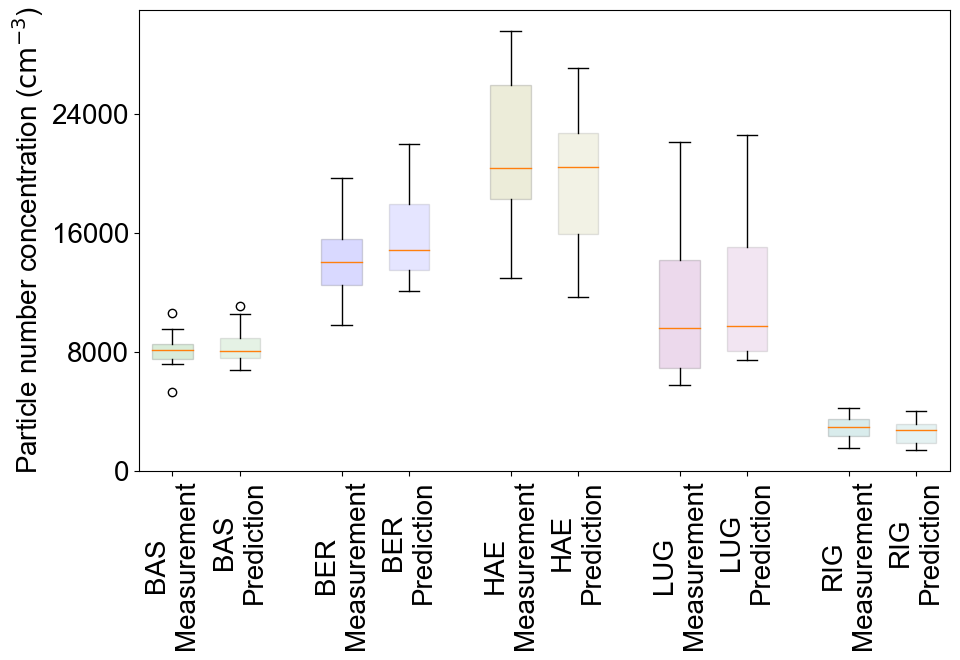

In [44]:
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import ScalarFormatter, MaxNLocator
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

stations = data_df['station'].unique()
colors = ['green', 'blue', 'olive', 'purple', 'teal']
plt.figure(figsize=(10, 7), dpi=100)

positions = []
for idx, station in enumerate(stations):
    station_data = data_df[data_df['station'] == station]
    box_data = [station_data['CPC [1/cm3]_mean'], station_data['stack_pred_mean']]
    pos = [idx*2.5, idx*2.5 + 1]
    positions.extend(pos)
    box = plt.boxplot(box_data, positions=pos, patch_artist=True, widths=0.6)

    for patch, color, alpha in zip(box['boxes'], [colors[idx % len(colors)]]*2, [0.15, 0.1]):
        patch.set_facecolor(color)
        patch.set_alpha(alpha)

labels = [f'{station}\nMeasurement' if i%2 == 0 else f'{station}\nPrediction' for station in stations for i in range(2)]
plt.xticks([pos for pos in positions], labels, rotation=90)
plt.ylabel(r"Particle number concentration ($\mathrm{cm}^{-3}$)")
plt.gca().yaxis.set_major_locator(MaxNLocator(4))
plt.tight_layout()
plt.savefig('../SI_figure/S1/stack_CPCvsPNC_boxplot.png', dpi=600, bbox_inches='tight')
plt.show()

- cross_validation

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

crossv_data = pd.read_csv('../../mypred/out/pred_table/pnc_pred/crossv_pncdata2020_pred1203.csv')
crossv_data = crossv_data.drop(['Unnamed: 0'], axis=1)
crossv_bias_2016_2019 = []
for col in crossv_data.filter(like='_pred').columns:
    # print(col, (crossv_data[col]<0).any())
    crossv_data[col] = crossv_data[col].clip(lower=0)
    # print(col, (crossv_data[col]<0).any())
    crossv_bias_2016_2019.append(np.mean(crossv_data[col] - crossv_data['CPC [1/cm3]']))
crossv_results = pd.read_csv('../../mypred/out/pred_table/results_plot/stack_crossv_results1203.csv')
crossv_results['RMSE'] = np.sqrt(crossv_results['mse'])
crossv_results['model'] = 'Stacking-' + crossv_results['stn']
crossv_results['M-Bias'] = np.abs(crossv_bias_2016_2019)
data_to_normalize = crossv_results[['mae', 'mse', 'RMSE', 'M-Bias']]
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(data_to_normalize)
normalized_columns = ['MAE score', 'MSE score', 'RMSE score', 'M-Bias score']
crossv_results[normalized_columns] = 1 - normalized_data
cross_data = crossv_results[['evs', 'MAE score', 'MSE score', 'RMSE score',
                         'r2', 'M-Bias score', 'model']]
cross_data = cross_data.rename(columns={'evs': 'EVS', 'r2': '$R^2$'})
cross_data['model'] = ['Stem-PNC (BAS)', 'Stem-PNC (BER)', 'Stem-PNC (HAE)',
                       'Stem-PNC (LUG)', 'Stem-PNC (RIG)']
cross_data_temp = cross_data.copy()
cross_data_temp[['EVS', '$R^2$']] = cross_data_temp[['EVS', '$R^2$']].applymap(lambda x: f'{x:.2f}')
cross_data_temp[['MAE score', 'MSE score', 'RMSE score', 'M-Bias score']] = cross_data_temp[['MAE score', 'MSE score', 'RMSE score', 'M-Bias score']].applymap(lambda x: f'{x:.2f}')
cross_data_temp

,EVS,MAE score,MSE score,RMSE score,$R^2$,M-Bias score,model
0,0.96,0.80,0.82,0.74,0.95,-0.00,Stem-PNC (BAS)
1,0.89,0.82,0.45,0.36,0.89,0.78,Stem-PNC (BER)
2,0.83,0.00,0.00,0.00,0.83,0.36,Stem-PNC (HAE)
3,0.95,1.00,0.81,0.73,0.94,1.00,Stem-PNC (LUG)
4,0.98,0.98,1.00,1.00,0.97,0.41,Stem-PNC (RIG)


In [2]:

crossv_data2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/crossv_pncdata2020_pred_1203(20162019pred2020).csv')
crossv_data2020 = crossv_data2020.drop(['Unnamed: 0'], axis=1)
crossv_bias_2020 = []
for col in crossv_data2020.filter(like='_pred').columns:
    if col in ['stack0_pred','stack1_pred','stack2_pred','stack3_pred','stack4_pred']:
        crossv_data2020[col] = crossv_data2020[col].clip(lower=0)
        crossv_bias_2020.append(np.mean(crossv_data2020[col] - crossv_data2020['CPC [1/cm3]']))
crossv_bias_2020.insert(0, 123.545752)
crossv_results_2020 = pd.read_csv('../../mypred/out/pred_table/results_plot/stack_crossv_results1203_2.csv')
crossv_results_2020['RMSE'] = np.sqrt(crossv_results_2020['mse'])
crossv_results_2020['model'] = 'Stacking-' + crossv_results_2020['stn']
crossv_results_2020['M-Bias'] = np.abs(crossv_bias_2020)
data_to_normalize = crossv_results_2020[['mae', 'mse', 'RMSE', 'M-Bias']]
scaler = MinMaxScaler()
normalized_data = scaler.fit_transform(data_to_normalize)
normalized_columns = ['MAE score', 'MSE score', 'RMSE score', 'M-Bias score']
crossv_results_2020[normalized_columns] = 1 - normalized_data
cross_data_2020 = crossv_results_2020[['evs', 'MAE score', 'MSE score', 'RMSE score',
                         'r2', 'M-Bias score', 'model']]
cross_data_2020 = cross_data_2020.rename(columns={'evs': 'EVS', 'r2': '$R^2$'})
cross_data['model'] = ['Stem-PNC (BAS)', 'Stem-PNC (BER)', 'Stem-PNC (HAE)',
                       'Stem-PNC (LUG)', 'Stem-PNC (RIG)']
cross_data_temp = cross_data.copy()
cross_data_temp[['EVS', '$R^2$']] = cross_data_temp[['EVS', '$R^2$']].applymap(lambda x: f'{x:.2f}')
cross_data_temp[['MAE score', 'MSE score', 'RMSE score', 'M-Bias score']] = cross_data_temp[['MAE score', 'MSE score', 'RMSE score', 'M-Bias score']].applymap(lambda x: f'{x:.2f}')
cross_data_temp

,EVS,MAE score,MSE score,RMSE score,$R^2$,M-Bias score,model
0,0.96,0.80,0.82,0.74,0.95,-0.00,Stem-PNC (BAS)
1,0.89,0.82,0.45,0.36,0.89,0.78,Stem-PNC (BER)
2,0.83,0.00,0.00,0.00,0.83,0.36,Stem-PNC (HAE)
3,0.95,1.00,0.81,0.73,0.94,1.00,Stem-PNC (LUG)
4,0.98,0.98,1.00,1.00,0.97,0.41,Stem-PNC (RIG)


In [3]:
from sklearn.metrics import r2_score

crossv_data2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/crossv_pncdata2020_pred_1203(20162019pred2020).csv')
crossv_data2020 = crossv_data2020.drop(['Unnamed: 0'], axis=1)
crossv_bias_2020 = []
for col in crossv_data2020.filter(like='_pred').columns:
    if col in ['stack0_pred','stack1_pred','stack2_pred','stack3_pred','stack4_pred']:
        crossv_data2020[col] = crossv_data2020[col].clip(lower=0)
        crossv_bias_2020.append(np.mean(crossv_data2020[col] - crossv_data2020['CPC [1/cm3]']))

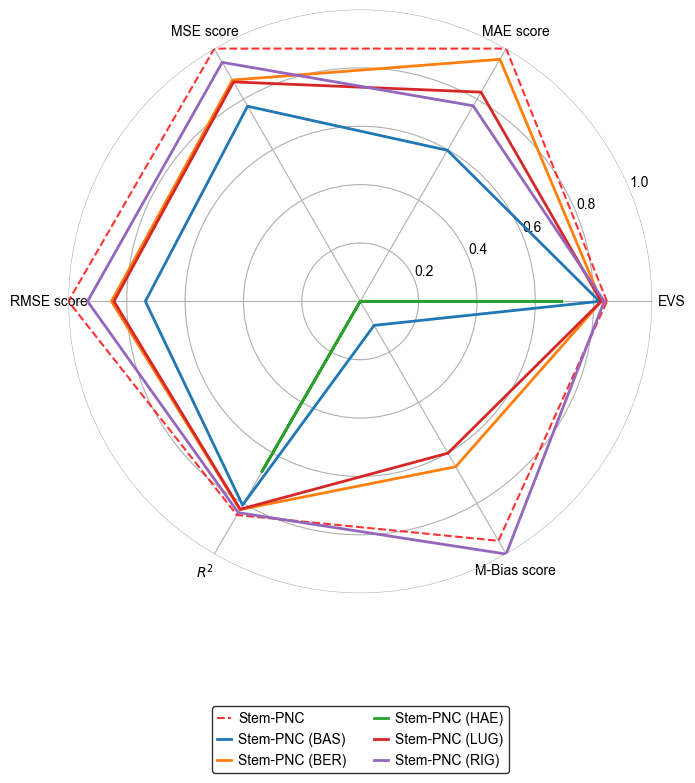

In [4]:
import matplotlib.pyplot as plt
from math import pi
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 24

cross_df_2020 = cross_data_2020.copy()
cross_df_2020['model'] = ['Stacking-ALL', 'Stem-PNC (BAS)', 'Stem-PNC (BER)', 'Stem-PNC (HAE)',
                          'Stem-PNC (LUG)', 'Stem-PNC (RIG)']

# set the angle of the radar chart
labels=np.array(cross_df_2020.columns[:-1])  # expect the last column-model
num_vars = len(labels)

# calculate the angle
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
angles += angles[:1]

# plot radar chart
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True), dpi=100)

# plot each station's performance
for i, row in cross_df_2020.iterrows():
    if row['model'] == 'Stacking-ALL':
        data = row[:-1].tolist()
        data += data[:1]
        ax.plot(angles, data, linewidth=1.5, linestyle='--', label='Stem-PNC', color='r', alpha=0.8)
        ax.fill(angles, data, alpha=0)
    else:
        data = row[:-1].tolist()
        data += data[:1]
        ax.plot(angles, data, linewidth=2, linestyle='solid', label=row['model'])
        ax.fill(angles, data, alpha=0)
ax.set_thetagrids(np.degrees(angles[:-1]), labels)
ax.set_ylim(0, 1)
ax.set_frame_on(False)
plt.legend(loc='lower center', ncol=2, edgecolor='black', bbox_to_anchor=(0.5, -0.32),
           handlelength=1, handletextpad=0.5)
plt.tight_layout()
plt.savefig('./figure/stack_crossv_radar_2020.png', dpi=600, bbox_inches='tight')
plt.show()

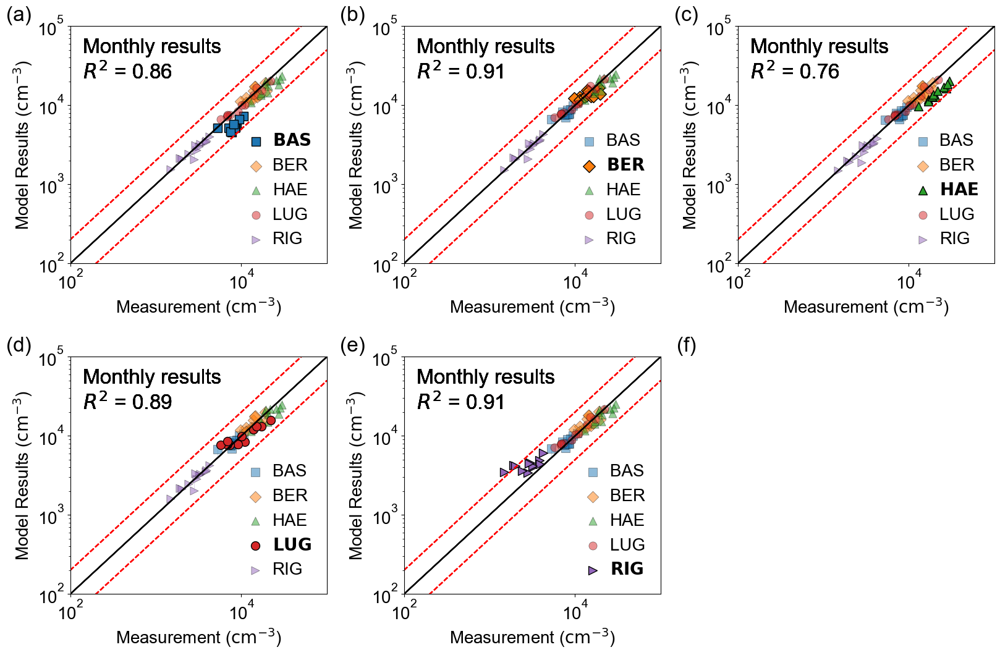

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 100, 100000

model_station_map = {'stack0_pred': 'BAS', 'stack1_pred': 'BER', 'stack2_pred': 'HAE',
                     'stack3_pred': 'LUG', 'stack4_pred': 'RIG'}
stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
titles = ['(a)', '(b)', '(c)', '(d)', '(e)']
colors = sns.color_palette("tab10", n_colors=len(stations))
marker_size = 90

pnc_data_pred = pd.read_csv('../../mypred/out/pred_table/pnc_pred/crossv_pncdata2020_pred_1203(20162019pred2020).csv')
pnc_data_pred = pnc_data_pred.iloc[:, 1:]
pnc_data_pred['month_year'] = pd.to_datetime(pnc_data_pred['Date/time']).dt.strftime('%Y-%m')
pnc_data_pred = pnc_data_pred.drop(columns=['Date/time'])
grouped_data = pnc_data_pred.groupby(['month_year', 'station']).mean().reset_index()


fig, axs = plt.subplots(2, 3, figsize=(16.5, 11), dpi=100)
axs = axs.flatten()
for idx, (model_col, excluded_station) in enumerate(model_station_map.items()):
    ax = axs[idx]
    for station, color, marker in zip(stations, colors, markers):
        station_data = grouped_data[grouped_data['station'] == station]

        # for all stations
        X = np.log(grouped_data['CPC [1/cm3]'])
        y = np.log(grouped_data[model_col])
        X = sm.add_constant(X)
        overall_model = sm.OLS(y, X).fit()
        overall_coefficients = r2_score(grouped_data['CPC [1/cm3]'], grouped_data[model_col])
        
        if station == excluded_station:
            ax.scatter(station_data['CPC [1/cm3]'], station_data[model_col],
                        label=f"$\mathbf{{{station}}}$", color=color,
                        edgecolors='black', linewidths=1, s=100, marker=marker)
        else:
            ax.scatter(station_data['CPC [1/cm3]'], station_data[model_col], label=station,
                        color=color, alpha=0.5, edgecolors='k', marker=marker, s=marker_size, linewidths=0.5)
            ax.vlines(station_data['CPC [1/cm3]'], station_data['CPC [1/cm3]'],
                    station_data[model_col], color=color, linestyle='dotted', lw=0.5)
            
        ax.set_xscale('log')
        ax.set_yscale('log')

        # y=x line on log-log scale
        ax.plot([min_temp, max_temp], [min_temp, max_temp], 'k')
        upper_bound = 2 * np.array([min_temp, max_temp])
        lower_bound = 0.5 * np.array([min_temp, max_temp])
        ax.plot([min_temp, max_temp], upper_bound, 'r--')
        ax.plot([min_temp, max_temp], lower_bound, 'r--')
    
        # ax.set_xlabel(r"True PNC ($\# \cdot cm^{-3}$)", fontsize=20)
        # ax.set_ylabel(r"Predicted PNC ($\# \cdot cm^{-3}$)", fontsize=20)
        ax.set_xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
        ax.set_ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
        ax.set_xlim(min_temp, max_temp)
        ax.set_ylim(min_temp, max_temp)
        ax.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
        ax.title.set_text(f'{titles[idx]}')
        ax.title.set_position([-0.2, 1.2])
        ax.text(x=0.05, y=0.95, s = r'Monthly results', verticalalignment='top', horizontalalignment='left',
                fontsize=24, transform=ax.transAxes)
        ax.text(x=0.05, y=0.85, s = f'$R^2$ = {overall_coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
                fontsize=24, transform=ax.transAxes)
# Hide the last subplot if it's empty
if len(model_station_map) < len(axs):
    axs[-1].axis('off')
axs[5].title.set_text(f'(f)')
axs[5].title.set_position([-0.2, 1.2])  # [horizontal, vertical] alignment of title

plt.tight_layout()
plt.savefig('./figure/corssv_Monthly2020.png', dpi=600)
plt.show()

In [24]:
skewness = grouped_data.skew().filter(like='_pred')
kurtosis = grouped_data.kurt().filter(like='_pred')

C:\Users\15810\AppData\Local\Temp/ipykernel_18192/2392315576.py:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  skewness = grouped_data.skew().filter(like='_pred')
C:\Users\15810\AppData\Local\Temp/ipykernel_18192/2392315576.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  kurtosis = grouped_data.kurt().filter(like='_pred')


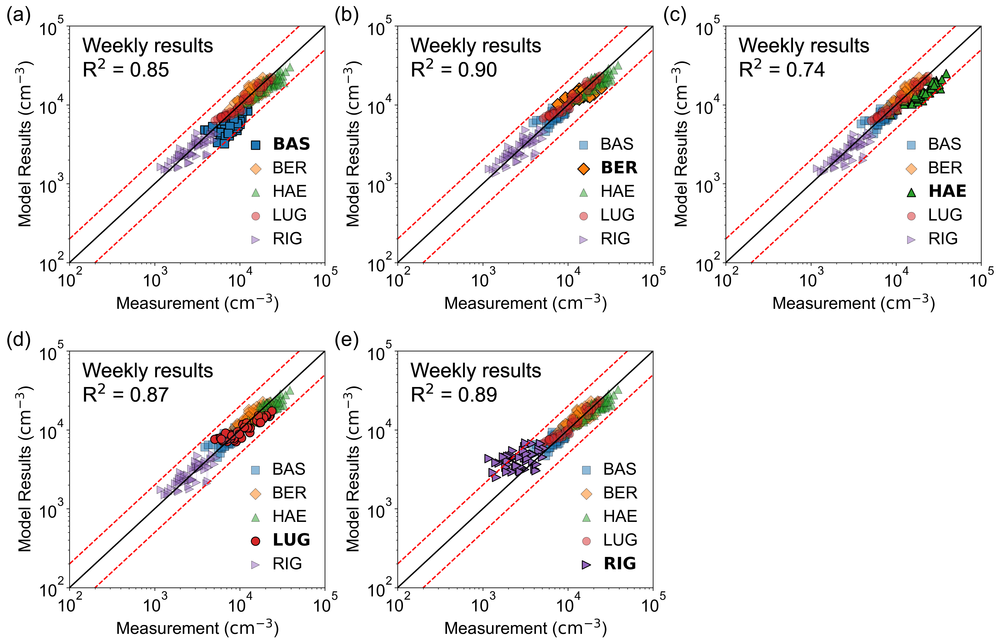

In [218]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 100, 100000

model_station_map = {'stack0_pred': 'BAS', 'stack1_pred': 'BER', 'stack2_pred': 'HAE',
                     'stack3_pred': 'LUG', 'stack4_pred': 'RIG'}
stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
titles = ['(a)', '(b)', '(c)', '(d)', '(e)']
colors = sns.color_palette("tab10", n_colors=len(stations))
marker_size = 90

pnc_pred2020 = pd.read_csv('../../mypred/out/pred_table/pnc_pred/crossv_pncdata2020_pred_1203(20162019pred2020).csv')
pnc_pred2020 = pnc_pred2020.drop(['Unnamed: 0'], axis=1)
pnc_pred2020.index = pd.to_datetime(pnc_pred2020['Date/time'])
pnc_pred2020 = pnc_pred2020.drop(columns=['Date/time'])
pnc_pred2020 = pnc_pred2020.groupby('station').resample('W').mean()
pnc_pred2020 = pnc_pred2020.reset_index()
pnc_pred2020['week_year'] = pnc_pred2020['Date/time'].dt.strftime('%Y-%W')
grouped_data = pnc_pred2020.groupby(['week_year', 'station']).mean().reset_index()


fig, axs = plt.subplots(2, 3, figsize=(16.5, 11), dpi=300)
axs = axs.flatten()
for idx, (model_col, excluded_station) in enumerate(model_station_map.items()):
    ax = axs[idx]
    for station, color, marker in zip(stations, colors, markers):
        station_data = grouped_data[grouped_data['station'] == station]

        # for all stations
        X = np.log(grouped_data['CPC [1/cm3]'])
        y = np.log(grouped_data[model_col])
        X = sm.add_constant(X)
        overall_model = sm.OLS(y, X).fit()
        overall_coefficients = r2_score(grouped_data['CPC [1/cm3]'], grouped_data[model_col])
        
        if station == excluded_station:
            ax.scatter(station_data['CPC [1/cm3]'], station_data[model_col],
                        label=f"$\mathbf{{{station}}}$", color=color,
                        edgecolors='black', linewidths=1, s=100, marker=marker)
        else:
            ax.scatter(station_data['CPC [1/cm3]'], station_data[model_col], label=station,
                        color=color, alpha=0.5, edgecolors='k', marker=marker, s=marker_size, linewidths=0.5)
            ax.vlines(station_data['CPC [1/cm3]'], station_data['CPC [1/cm3]'],
                    station_data[model_col], color=color, linestyle='dotted', lw=0.5)
            
        ax.set_xscale('log')
        ax.set_yscale('log')

        # y=x line on log-log scale
        ax.plot([min_temp, max_temp], [min_temp, max_temp], 'k')
        upper_bound = 2 * np.array([min_temp, max_temp])
        lower_bound = 0.5 * np.array([min_temp, max_temp])
        ax.plot([min_temp, max_temp], upper_bound, 'r--')
        ax.plot([min_temp, max_temp], lower_bound, 'r--')
    
        # ax.set_xlabel(r"True PNC ($\# \cdot cm^{-3}$)", fontsize=20)
        # ax.set_ylabel(r"Predicted PNC ($\# \cdot cm^{-3}$)", fontsize=20)
        ax.set_xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
        ax.set_ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
        ax.set_xlim(min_temp, max_temp)
        ax.set_ylim(min_temp, max_temp)
        ax.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
        ax.title.set_text(f'{titles[idx]}')
        ax.title.set_position([-0.2, 1.2])  # [horizontal, vertical] alignment of title
        ax.text(x=0.05, y=0.95, s = r'Weekly results', verticalalignment='top', horizontalalignment='left',
                fontsize=24, transform=ax.transAxes)
        ax.text(x=0.05, y=0.85, s = f'R$^2$ = {overall_coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
                fontsize=24, transform=ax.transAxes)
# Hide the last subplot if it's empty
if len(model_station_map) < len(axs):
    axs[-1].axis('off')
# axs[5].title.set_text(f'(f)')
# axs[5].title.set_position([-0.2, 1.2])  # [horizontal, vertical] alignment of title

plt.tight_layout()
plt.savefig('../SI_figure/S1/corssv_Weekly2020.png', dpi=600, bbox_inches='tight')
plt.show()

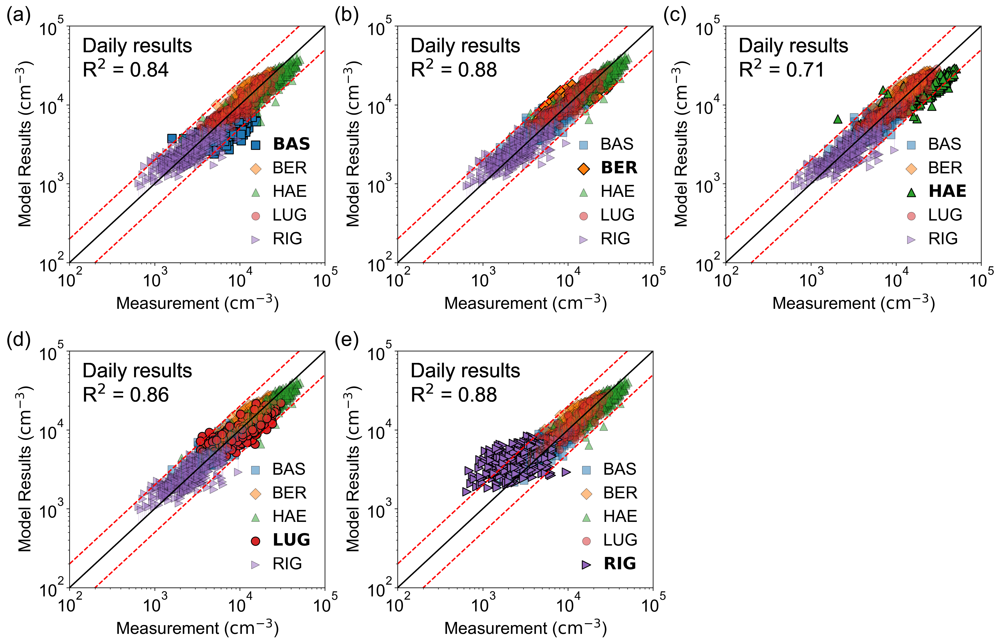

In [219]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

min_temp, max_temp = 100, 100000

model_station_map = {'stack0_pred': 'BAS', 'stack1_pred': 'BER', 'stack2_pred': 'HAE',
                     'stack3_pred': 'LUG', 'stack4_pred': 'RIG'}
stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
titles = ['(a)', '(b)', '(c)', '(d)', '(e)']
colors = sns.color_palette("tab10", n_colors=len(stations))
marker_size = 90

pnc_data_pred = pd.read_csv('../../mypred/out/pred_table/pnc_pred/crossv_pncdata2020_pred_1203(20162019pred2020).csv')
pnc_data_pred = pnc_data_pred.iloc[:, 1:]
pnc_data_pred ['date'] = pd.to_datetime(pnc_data_pred ['Date/time']).dt.date
pnc_data_pred  = pnc_data_pred .drop(columns=['Date/time'])
grouped_data = pnc_data_pred .groupby([pnc_data_pred ['date'], 'station']).mean().reset_index()


fig, axs = plt.subplots(2, 3, figsize=(16.5, 11), dpi=300)
axs = axs.flatten()
for idx, (model_col, excluded_station) in enumerate(model_station_map.items()):
    ax = axs[idx]
    for station, color, marker in zip(stations, colors, markers):
        station_data = grouped_data[grouped_data['station'] == station]

        # for all stations
        X = np.log(grouped_data['CPC [1/cm3]'])
        y = np.log(grouped_data[model_col])
        X = sm.add_constant(X)
        overall_model = sm.OLS(y, X).fit()
        overall_coefficients = r2_score(grouped_data['CPC [1/cm3]'], grouped_data[model_col])
        
        if station == excluded_station:
            ax.scatter(station_data['CPC [1/cm3]'], station_data[model_col],
                        label=f"$\mathbf{{{station}}}$", color=color,
                        edgecolors='black', linewidths=1, s=100, marker=marker)
        else:
            ax.scatter(station_data['CPC [1/cm3]'], station_data[model_col], label=station,
                        color=color, alpha=0.5, edgecolors='k', marker=marker, s=marker_size, linewidths=0.5)
            ax.vlines(station_data['CPC [1/cm3]'], station_data['CPC [1/cm3]'],
                    station_data[model_col], color=color, linestyle='dotted', lw=0.5)
            
        ax.set_xscale('log')
        ax.set_yscale('log')

        # y=x line on log-log scale
        ax.plot([min_temp, max_temp], [min_temp, max_temp], 'k')
        upper_bound = 2 * np.array([min_temp, max_temp])
        lower_bound = 0.5 * np.array([min_temp, max_temp])
        ax.plot([min_temp, max_temp], upper_bound, 'r--')
        ax.plot([min_temp, max_temp], lower_bound, 'r--')
    
        # ax.set_xlabel(r"True PNC ($\# \cdot cm^{-3}$)", fontsize=20)
        # ax.set_ylabel(r"Predicted PNC ($\# \cdot cm^{-3}$)", fontsize=20)
        ax.set_xlabel(r"Measurement ($\mathrm{cm}^{-3}$)", fontsize=20)
        ax.set_ylabel(r"Model Results ($\mathrm{cm}^{-3}$)", fontsize=20)
        ax.set_xlim(min_temp, max_temp)
        ax.set_ylim(min_temp, max_temp)
        ax.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
        ax.title.set_text(f'{titles[idx]}')
        ax.title.set_position([-0.2, 1.2])  # [horizontal, vertical] alignment of title
        ax.text(x=0.05, y=0.95, s = r'Daily results', verticalalignment='top', horizontalalignment='left',
                fontsize=24, transform=ax.transAxes)
        ax.text(x=0.05, y=0.85, s = f'R$^2$ = {overall_coefficients:.2f}', verticalalignment='top', horizontalalignment='left',
                fontsize=24, transform=ax.transAxes)
# Hide the last subplot if it's empty
if len(model_station_map) < len(axs):
    axs[-1].axis('off')
# axs[5].title.set_text(f'(f)')
# axs[5].title.set_position([-0.2, 1.2])  # [horizontal, vertical] alignment of title

plt.tight_layout()
plt.savefig('../SI_figure/S1/corssv_Daily2020.png', dpi=600, bbox_inches='tight')
plt.show()

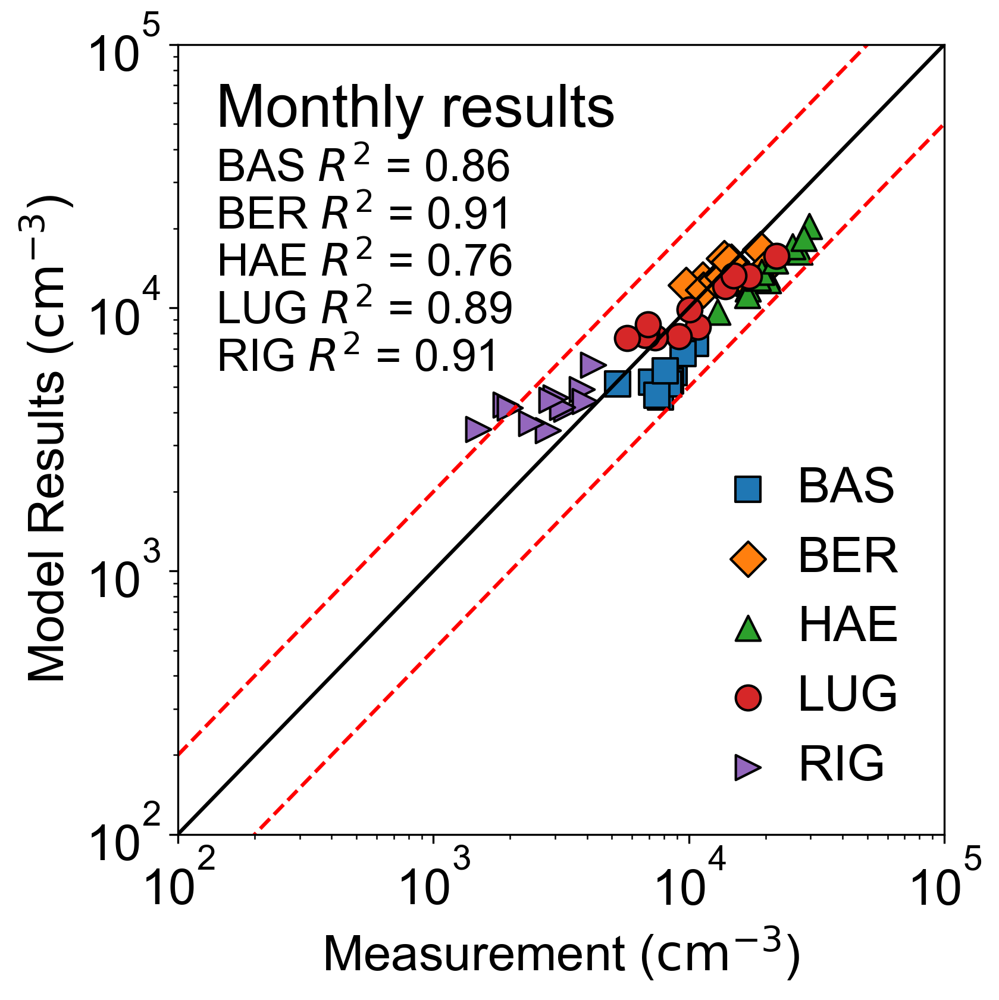

In [210]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 20

pnc_data_pred = pd.read_csv('../../mypred/out/pred_table/pnc_pred/crossv_pncdata2020_pred_1203(20162019pred2020).csv')
pnc_data_pred = pnc_data_pred.iloc[:, 1:]
pnc_data_pred['month_year'] = pd.to_datetime(pnc_data_pred['Date/time']).dt.strftime('%Y-%m')
pnc_data_pred = pnc_data_pred.drop(columns=['Date/time'])
grouped_data = pnc_data_pred.groupby(['month_year', 'station']).mean().reset_index()

model_station_map = {'stack0_pred': 'BAS', 'stack1_pred': 'BER', 'stack2_pred': 'HAE',
                     'stack3_pred': 'LUG', 'stack4_pred': 'RIG'}
stations = ['BAS', 'BER', 'HAE', 'LUG', 'RIG']
markers = ['s', 'D', '^', 'o', '>']
colors = sns.color_palette("tab10", n_colors=len(stations))

min_temp, max_temp = 100, 100000
overall_coefficients = []

plt.figure(figsize=(6, 6), dpi=300)

for model_col, station in model_station_map.items():
    station_data = grouped_data[grouped_data['station'] == station]
    
    plt.scatter(station_data['CPC [1/cm3]'], station_data[model_col],
                 label=f"{station}", color=colors[stations.index(station)],
                 edgecolors='black', linewidths=1, s=100, marker=markers[stations.index(station)])

    overall_coefficients.append(r2_score(grouped_data['CPC [1/cm3]'], grouped_data[model_col]))

plt.plot([min_temp, max_temp], [min_temp, max_temp], 'k')
plt.plot([min_temp, max_temp], 2 * np.array([min_temp, max_temp]), 'r--')
plt.plot([min_temp, max_temp], 0.5 * np.array([min_temp, max_temp]), 'r--')
plt.xscale('log')
plt.yscale('log')
plt.xlabel(r"Measurement ($\mathrm{cm}^{-3}$)")
plt.ylabel(r"Model Results ($\mathrm{cm}^{-3}$)")
plt.xlim(min_temp, max_temp)
plt.ylim(min_temp, max_temp)
plt.legend(loc='lower right', frameon=False, handlelength=1, handletextpad=0.5)
plt.text(x=0.05, y=0.95, s = r'Monthly results', verticalalignment='top', horizontalalignment='left',
         fontsize=24, transform=plt.gca().transAxes)
plt.text(x=0.05, y=0.87, s = f'BAS $R^2$ = {overall_coefficients[0]:.2f}', verticalalignment='top', horizontalalignment='left',
            fontsize=18, transform=plt.gca().transAxes)
plt.text(x=0.05, y=0.81, s = f'BER $R^2$ = {overall_coefficients[1]:.2f}', verticalalignment='top', horizontalalignment='left',
            fontsize=18, transform=plt.gca().transAxes)
plt.text(x=0.05, y=0.75, s = f'HAE $R^2$ = {overall_coefficients[2]:.2f}', verticalalignment='top', horizontalalignment='left',
            fontsize=18, transform=plt.gca().transAxes)
plt.text(x=0.05, y=0.69, s = f'LUG $R^2$ = {overall_coefficients[3]:.2f}', verticalalignment='top', horizontalalignment='left',
            fontsize=18, transform=plt.gca().transAxes)
plt.text(x=0.05, y=0.63, s = f'RIG $R^2$ = {overall_coefficients[4]:.2f}', verticalalignment='top', horizontalalignment='left',
            fontsize=18, transform=plt.gca().transAxes)

plt.tight_layout()
plt.savefig('../SI_figure/S1/highlighted_stations_monthly.png', dpi=600, bbox_inches='tight')
plt.show()
